# Joint DANN eval — Lipschitz encoder + MAF5, v3

Evaluates `exp-v3_encoder-lipschitz_dann_flow-maf5`: 300k sims, WDGRL (λ=0.5, 100-ep ramp),
Mixup real augmentation, 400 epochs. Final: task=12.84, w1=0.85.

Key difference from OT pipeline: encoder is jointly trained with WDGRL domain adaptation — no
separate `enc_real`/`enc_joint`. A single `encoder.pt` maps both sims and reals; the flow
samples directly on `encoder(x_real)` without a nearest-neighbour proxy.

1. **Training curves** — task loss, W1, lambda
2. **Latent space** — PCA/UMAP: encoder(sim) vs encoder(real)
3. **Direct inference** — sample flow on real patients
4. **Parameter scatter** — posterior mean vs GT (Cas, Eap, Rap/PVR, Ras/SVR)
5. **Hypertension stratification**

In [50]:
import json, sys, h5py, csv
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import torch

try:
    ROOT = Path(globals()['_dh'][0]).parent
    assert (ROOT / 'dataset.py').exists()
except:
    ROOT = Path('/home/sa4604/cv-dann-sbi')
sys.path.insert(0, str(ROOT))

from dataset import (
    load_stats, load_manifest, ReducedCVDataset,
    PARAM_KEYS_INFER, N_CHANNELS, T, WAVE_KEYS_CONT,
)
from models import LipschitzReducedAutoencoderEncoder

WAVE_KEYS_REAL = ['Prv', 'Pra', 'Pvp', 'Pap']

device = torch.device('cuda:0')
print('device:', device)

device: cuda:0


In [ ]:
RUN        = 'exp-v3c_encoder-lipschitz_dann_flow-maf5'
VERSION    = '3c'
RUN_DIR    = ROOT / f'outputs/{RUN}'

REAL_DATA       = Path('/home/sa4604/real_data/onebeat_300patients')
SIM_ROOT        = Path('/media/local/SimData/hdf5/cv8/simset_10M_cv8Eed_20260314')
STATS_PATH      = ROOT / 'norm_stats_v3c.json'
MANIFEST_FULL   = SIM_ROOT / 'manifest_train.json'
MANIFEST_V3C    = ROOT / 'manifest_train_v3.3.json'

N_POSTERIOR_SAMPLES = 1000
N_SIM_PCA           = 500

stats    = load_stats(STATS_PATH)
manifest = load_manifest(MANIFEST_V3C)
lo_t = torch.tensor([manifest['config']['pvar_low'][k]  for k in PARAM_KEYS_INFER], dtype=torch.float32)
hi_t = torch.tensor([manifest['config']['pvar_high'][k] for k in PARAM_KEYS_INFER], dtype=torch.float32)
print('Prior bounds loaded for', len(PARAM_KEYS_INFER), 'parameters')

## PCA selection: are the 300k sims nearest to reals?

In [ ]:
import numpy as np
import h5py
from sklearn.decomposition import PCA as SklearnPCA
import matplotlib.pyplot as plt

N_POOL_SAMPLE    = 20_000   # random sample from full sim pool for background
N_SELECTED_SAMPLE = 20_000  # random sample from v3c selected 300k

wave_keys = ['Prv', 'Pra', 'Pvp', 'Pap']
w = stats['waves']
wave_mean = np.array([w[k]['mean'] for k in wave_keys], dtype=np.float32)[:, None]
wave_std  = np.array([w[k]['std']  for k in wave_keys], dtype=np.float32)[:, None] + 1e-8

def load_sim_waves_flat(index, n):
    rng = np.random.default_rng(0)
    idx = rng.choice(len(index), size=min(n, len(index)), replace=False)
    parts = []
    for i in sorted(idx):
        entry = index[i]
        fpath = SIM_ROOT / 'train' / entry['file']
        with h5py.File(fpath, 'r') as f:
            waves = np.stack([f[entry['group']][f'waves/{k}'][:].astype(np.float32) for k in wave_keys])
        parts.append(((waves - wave_mean) / wave_std).reshape(-1))
    return np.stack(parts)

def load_real_waves_flat():
    parts = []
    for fpath in sorted(REAL_DATA.glob('*.h5')):
        with h5py.File(fpath, 'r') as f:
            beat_keys = sorted(k for k in f.keys() if k.startswith('beat_'))
            if not beat_keys:
                continue
            g = f[beat_keys[0]]
            waves = np.stack([g[f'waves/{k}'][:].astype(np.float32) for k in wave_keys])
        parts.append(((waves - wave_mean) / wave_std).reshape(-1))
    return np.stack(parts)

print('Loading full pool sample...')
manifest_full = load_manifest(MANIFEST_FULL)
X_pool = load_sim_waves_flat(manifest_full['index'], N_POOL_SAMPLE)

print('Loading v3c selected sample...')
X_sel = load_sim_waves_flat(manifest['index'], N_SELECTED_SAMPLE)

print('Loading real patients...')
X_real = load_real_waves_flat()

print(f'Pool sample: {X_pool.shape}  Selected sample: {X_sel.shape}  Reals: {X_real.shape}')

# Fit 2-component PCA on the pool sample
pca2 = SklearnPCA(n_components=2, random_state=42)
pca2.fit(X_pool)
var = pca2.explained_variance_ratio_
print(f'PC1+PC2 variance explained: {var.sum():.3f} ({var[0]:.3f} + {var[1]:.3f})')

Z_pool = pca2.transform(X_pool)
Z_sel  = pca2.transform(X_sel)
Z_real = pca2.transform(X_real)

fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(Z_pool[:, 0], Z_pool[:, 1], s=2, alpha=0.15, color='#aaaaaa', label=f'Full pool (n={N_POOL_SAMPLE:,})', rasterized=True)
ax.scatter(Z_sel[:, 0],  Z_sel[:, 1],  s=2, alpha=0.3,  color='steelblue', label=f'v3c selected (n={N_SELECTED_SAMPLE:,})', rasterized=True)
ax.scatter(Z_real[:, 0], Z_real[:, 1], s=18, alpha=0.9, color='crimson', label=f'Real patients (n={len(Z_real)})', zorder=5)
ax.set_xlabel(f'PC1 ({var[0]:.1%} var)')
ax.set_ylabel(f'PC2 ({var[1]:.1%} var)')
ax.set_title('PCA of Prv/Pra/Pvp/Pap waveforms — v3c sim selection vs full pool')
ax.legend(markerscale=3)
plt.tight_layout()
plt.show()

## Training curves

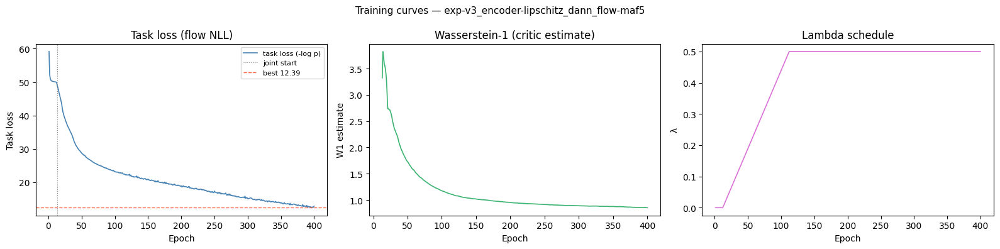

Total epochs: 400  best task (joint): 12.3933  final W1: 0.8533


In [52]:
csv_files = sorted(RUN_DIR.glob('train_log_*.csv'))
assert csv_files, f'No train_log CSV in {RUN_DIR}'

epochs, task_l, w1_l, gp_l, lam_l, phase_l = [], [], [], [], [], []
with open(csv_files[-1]) as f:
    for row in csv.DictReader(f):
        epochs.append(int(row['epoch']))
        task_l.append(float(row['task']))
        w1_l.append(float(row['w1_est']))
        gp_l.append(float(row['gp']))
        lam_l.append(float(row['lambda']))
        phase_l.append(int(row['phase']))

epochs = np.array(epochs)
joint_start = next(i for i, p in enumerate(phase_l) if p == 2)

fig, axes = plt.subplots(1, 3, figsize=(16, 4))

ax = axes[0]
ax.plot(epochs, task_l, color='steelblue', linewidth=1.2, label='task loss (-log p)')
ax.axvline(epochs[joint_start], color='grey', linestyle=':', linewidth=0.8, label='joint start')
best_task = min(task_l[joint_start:])
ax.axhline(best_task, color='tomato', linestyle='--', linewidth=1, label=f'best {best_task:.2f}')
ax.set_xlabel('Epoch'); ax.set_ylabel('Task loss'); ax.set_title('Task loss (flow NLL)')
ax.legend(fontsize=8)

ax = axes[1]
ax.plot(epochs[joint_start:], w1_l[joint_start:], color='mediumseagreen', linewidth=1.2)
ax.set_xlabel('Epoch'); ax.set_ylabel('W1 estimate'); ax.set_title('Wasserstein-1 (critic estimate)')

ax = axes[2]
ax.plot(epochs, lam_l, color='orchid', linewidth=1.2)
ax.set_xlabel('Epoch'); ax.set_ylabel('λ'); ax.set_title('Lambda schedule')

fig.suptitle(f'Training curves — {RUN}', fontsize=11)
plt.tight_layout(); plt.show()
print(f'Total epochs: {len(epochs)}  best task (joint): {best_task:.4f}  final W1: {w1_l[-1]:.4f}')

## Load models

In [53]:
encoder = LipschitzReducedAutoencoderEncoder(latent_dim=128).to(device)
encoder.load_state_dict(torch.load(RUN_DIR / 'encoder.pt', map_location=device))
encoder.eval()
print('Encoder loaded:', encoder.describe())

flow_net = torch.load(RUN_DIR / 'flow_net.pt', map_location=device, weights_only=False)
flow_net.eval()
print('Flow loaded:', type(flow_net).__name__)

Encoder loaded: {'type': 'LipschitzReducedAutoencoderEncoder', 'input_waveforms': '(4, 201)', 'input_scalars': 'Pas_mean, Pas_max, Pas_min, SV, HR_z', 'latent_dim': 128, 'proj_hidden': None, 'sn_ceiling': 2.0, 'n_params': 439617}
Flow loaded: NFlowsFlow


## Load real patients

In [54]:
w = stats['waves']
p = stats['parameters']
wave_mean = torch.tensor([w[k]['mean'] for k in WAVE_KEYS_REAL], dtype=torch.float32).unsqueeze(1)
wave_std  = torch.tensor([w[k]['std']  for k in WAVE_KEYS_REAL], dtype=torch.float32).unsqueeze(1)
pas_mean, pas_std = w['Pas']['mean'], w['Pas']['std'] + 1e-8
vlv_std           = w['Vlv']['std'] + 1e-8
hr_mean,  hr_std  = p['HR']['mean'],  p['HR']['std']  + 1e-8

patients = []
for fpath in sorted(REAL_DATA.glob('*.h5')):
    beats_x, gt = [], {}
    with h5py.File(fpath, 'r') as f:
        for bk in sorted(f.keys()):
            if not bk.startswith('beat_'): continue
            g = f[bk]
            waves = np.stack([g[f'waves/{k}'][:].astype(np.float32) for k in WAVE_KEYS_REAL])
            wt    = (torch.from_numpy(waves) - wave_mean) / (wave_std + 1e-8)
            sbp   = float(g['summaries/sbp'][()])
            dbp   = float(g['summaries/dbp'][()])
            map_  = float(g['summaries/map'][()])
            sv    = float(g['summaries/sv'][()])
            hr    = float(g['parameters/HR'][()])
            sc = torch.tensor([
                (map_ - pas_mean) / pas_std,
                (sbp  - pas_mean) / pas_std,
                (dbp  - pas_mean) / pas_std,
                sv    / vlv_std,
                (hr   - hr_mean)  / hr_std,
            ], dtype=torch.float32)
            beats_x.append(torch.cat([wt.reshape(-1), sc]))
            if not gt:
                gt = {k: float(g[f'parameters/{k}'][()]) for k in f[bk]['parameters'].keys()}
                # summaries
                for sk in g['summaries'].keys():
                    gt[sk] = float(g[f'summaries/{sk}'][()])
                # covariates (cohort label, id)
                cov = g['covariates']
                gt['cohort'] = cov['cohort'][()].decode() if isinstance(cov['cohort'][()], bytes) else str(cov['cohort'][()])
                gt['id']     = cov['id'][()].decode()     if isinstance(cov['id'][()],     bytes) else str(cov['id'][()])
    if beats_x:
        x_beats = torch.stack(beats_x)
        patients.append(dict(file=fpath.stem, x_beats=x_beats, x_avg=x_beats.mean(0), gt=gt))

cohort_counts = {}
for pat in patients:
    c = pat['gt'].get('cohort', 'unknown')
    cohort_counts[c] = cohort_counts.get(c, 0) + 1
print(f'Loaded {len(patients)} patients, {sum(len(p["x_beats"]) for p in patients)} total beats')
print(f'Cohorts: {cohort_counts}')

Loaded 802 patients, 802 total beats
Cohorts: {'controls': 173, 'pah': 629}


## Latent space — PCA and UMAP

Key diagnostic: does `encoder(x_real)` fall inside the `encoder(x_sim)` cloud?
WDGRL was trained to minimize W1 between these distributions.

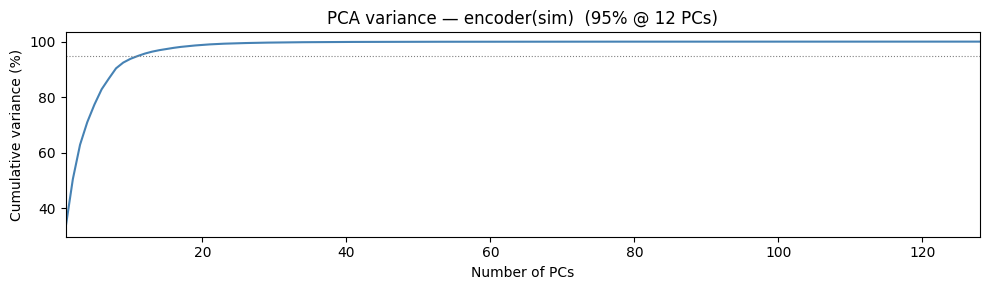

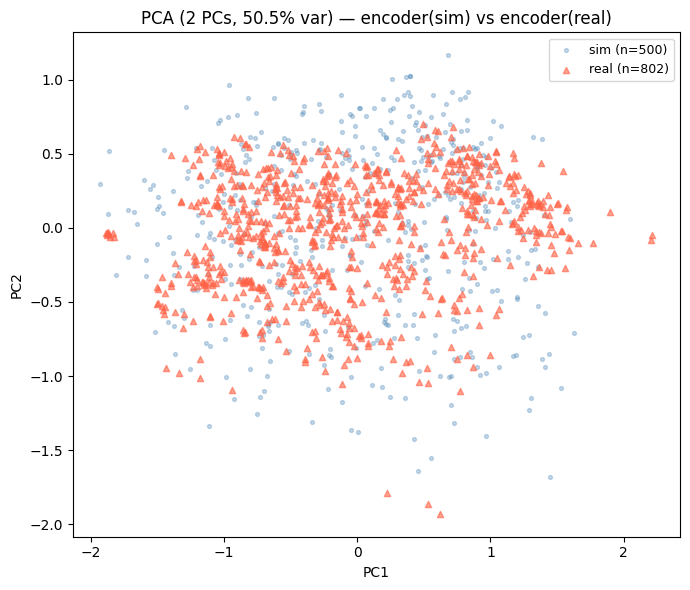

Running UMAP (12 PCs)...


/home/sa4604/cv-dann-sbi/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


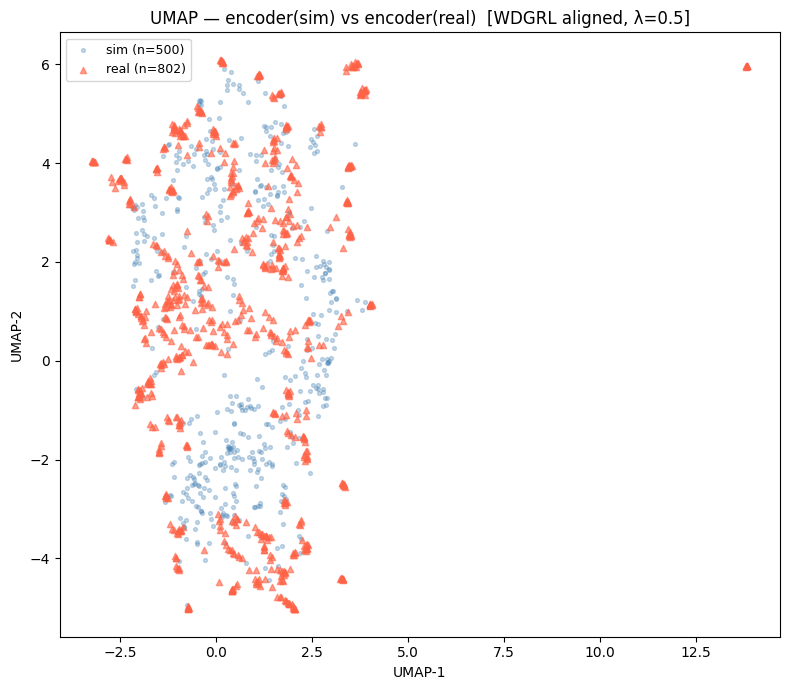

encoder(sim)  mean_std=0.116
encoder(real) mean_std=0.098  in sim bbox: 660/802 (82.3%)


In [55]:
from sklearn.decomposition import PCA
import umap

from torch.utils.data import DataLoader

ds_pca = ReducedCVDataset(str(SIM_ROOT / 'train'), manifest['index'][:N_SIM_PCA], stats)
_, x_sim_pca = next(iter(DataLoader(ds_pca, batch_size=N_SIM_PCA, num_workers=0)))
ds_pca.close()

with torch.no_grad():
    z_sim  = encoder(x_sim_pca.to(device)).cpu().numpy()
    z_real = torch.stack([
        encoder(pat['x_avg'].unsqueeze(0).to(device)).squeeze(0)
        for pat in patients
    ]).cpu().numpy()

# PCA variance
pca_full = PCA().fit(z_sim)
cumvar   = np.cumsum(pca_full.explained_variance_ratio_)
n_95     = int((cumvar < 0.95).sum()) + 1

fig, ax = plt.subplots(figsize=(10, 3))
ax.plot(np.arange(1, len(cumvar)+1), cumvar * 100, linewidth=1.5, color='steelblue')
ax.axhline(95, color='grey', linestyle=':', linewidth=0.8)
ax.set_xlabel('Number of PCs'); ax.set_ylabel('Cumulative variance (%)')
ax.set_title(f'PCA variance — encoder(sim)  (95% @ {n_95} PCs)')
ax.set_xlim(1, 128); plt.tight_layout(); plt.show()

# 2-PC scatter
pca2 = PCA(n_components=2).fit(z_sim)
zs2  = pca2.transform(z_sim)
zr2  = pca2.transform(z_real)
var  = pca2.explained_variance_ratio_.sum() * 100

fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(zs2[:, 0], zs2[:, 1], s=8,  alpha=0.3, color='steelblue', label=f'sim (n={N_SIM_PCA})')
ax.scatter(zr2[:, 0], zr2[:, 1], s=20, alpha=0.6, color='tomato',    label=f'real (n={len(patients)})', marker='^', zorder=5)
ax.set_title(f'PCA (2 PCs, {var:.1f}% var) — encoder(sim) vs encoder(real)')
ax.set_xlabel('PC1'); ax.set_ylabel('PC2'); ax.legend(fontsize=9)
plt.tight_layout(); plt.show()

# UMAP
print(f'Running UMAP ({n_95} PCs)...')
z_all  = pca_full.transform(np.concatenate([z_sim, z_real]))[:, :n_95]
z_umap = umap.UMAP(n_components=2, random_state=42, n_neighbors=20, min_dist=0.1).fit_transform(z_all)
ns     = len(z_sim)

fig, ax = plt.subplots(figsize=(8, 7))
ax.scatter(z_umap[:ns, 0], z_umap[:ns, 1], s=8,  alpha=0.3, color='steelblue', label=f'sim (n={ns})')
ax.scatter(z_umap[ns:, 0], z_umap[ns:, 1], s=20, alpha=0.6, color='tomato',    label=f'real (n={len(patients)})', marker='^', zorder=5)
ax.set_title(f'UMAP — encoder(sim) vs encoder(real)  [WDGRL aligned, λ=0.5]')
ax.set_xlabel('UMAP-1'); ax.set_ylabel('UMAP-2'); ax.legend(fontsize=9)
plt.tight_layout(); plt.show()

in_bounds = np.all((z_real >= z_sim.min(axis=0)) & (z_real <= z_sim.max(axis=0)), axis=1)
print(f'encoder(sim)  mean_std={z_sim.std(axis=0).mean():.3f}')
print(f'encoder(real) mean_std={z_real.std(axis=0).mean():.3f}  in sim bbox: {in_bounds.sum()}/{len(z_real)} ({in_bounds.mean()*100:.1f}%)')

## UMAP colored by parameter values

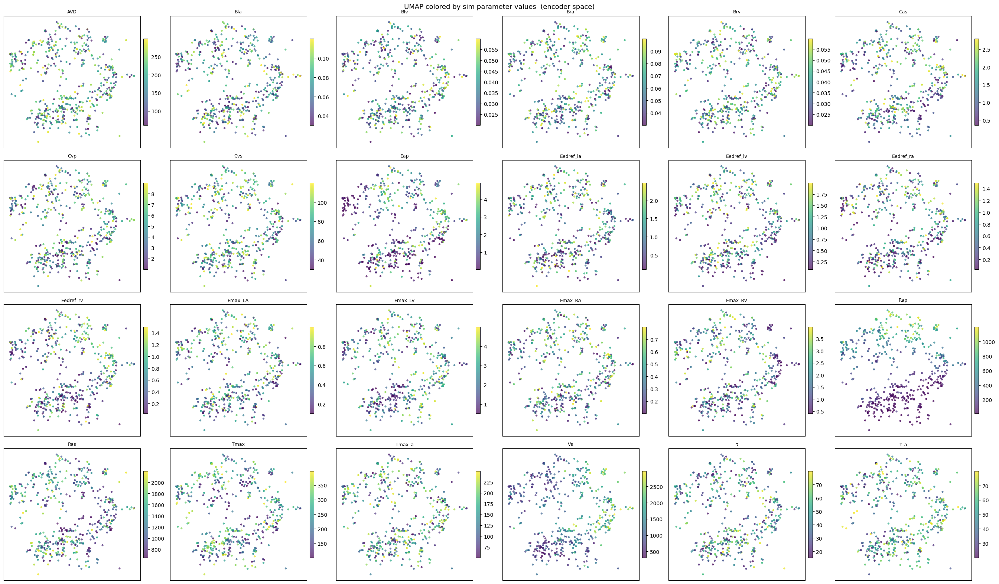

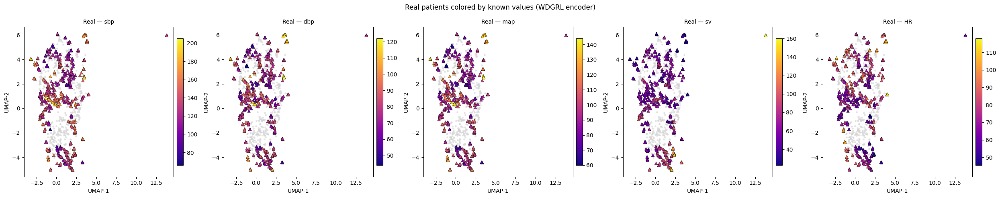

In [56]:
ds_theta = ReducedCVDataset(str(SIM_ROOT / 'train'), manifest['index'][:N_SIM_PCA], stats)
theta_sim_pca = torch.stack([ds_theta[i][0] for i in range(N_SIM_PCA)]).numpy()
ds_theta.close()

ncols, nrows = 6, 4
fig, axes = plt.subplots(nrows, ncols, figsize=(4.5 * ncols, 4 * nrows))
for i, name in enumerate(PARAM_KEYS_INFER):
    ax = axes[i // ncols, i % ncols]
    sc = ax.scatter(z_umap[:ns, 0], z_umap[:ns, 1], c=theta_sim_pca[:, i],
                    cmap='viridis', s=8, alpha=0.7, rasterized=True)
    plt.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
    ax.set_title(name, fontsize=9); ax.set_xticks([]); ax.set_yticks([])
for i in range(len(PARAM_KEYS_INFER), nrows * ncols):
    axes[i // ncols, i % ncols].axis('off')
fig.suptitle('UMAP colored by sim parameter values  (encoder space)', fontsize=13)
plt.tight_layout(); plt.show()

hemo_keys = ['sbp', 'dbp', 'map', 'sv', 'HR']
hemo_keys = [k for k in hemo_keys if k in patients[0]['gt']]
fig, axes = plt.subplots(1, len(hemo_keys), figsize=(5 * len(hemo_keys), 5))
for ai, key in enumerate(hemo_keys):
    vals = np.array([pat['gt'].get(key, np.nan) for pat in patients])
    mask = ~np.isnan(vals)
    ax = axes[ai]
    ax.scatter(z_umap[:ns, 0], z_umap[:ns, 1], s=6, color='lightgrey', alpha=0.5, rasterized=True)
    sc = ax.scatter(z_umap[ns:][mask, 0], z_umap[ns:][mask, 1],
                    c=vals[mask], cmap='plasma', s=30, marker='^',
                    edgecolors='black', linewidths=0.3, zorder=5)
    plt.colorbar(sc, ax=ax, fraction=0.04, pad=0.02)
    ax.set_title(f'Real — {key}', fontsize=10)
    ax.set_xlabel('UMAP-1'); ax.set_ylabel('UMAP-2')
fig.suptitle('Real patients colored by known values (WDGRL encoder)', fontsize=12)
plt.tight_layout(); plt.show()

## Direct inference — flow on real patients

No nearest-neighbour proxy needed: `encoder(x_real)` is directly in sim latent space
(that's what WDGRL trained for). Sample `flow(z_real)` directly.

In [57]:
cas_idx = PARAM_KEYS_INFER.index('Cas')
eap_idx = PARAM_KEYS_INFER.index('Eap')
rap_idx = PARAM_KEYS_INFER.index('Rap')
ras_idx = PARAM_KEYS_INFER.index('Ras')

import time
print(f'Direct inference on {len(patients)} real patients (N={N_POSTERIOR_SAMPLES} samples each)...')

cas_d, eap_d, rap_d, ras_d, accept_rates, theta_means = [], [], [], [], [], []
rap_samples_all = []   # full posteriors for calibration
ras_samples_all = []
t0 = time.time()

for pi, pat in enumerate(patients):
    x = pat['x_avg'].unsqueeze(0).to(device)
    with torch.no_grad():
        z       = encoder(x)                                              # (1, latent_dim)
        samples = flow_net.sample((N_POSTERIOR_SAMPLES,), condition=z)   # (N, 1, 24)
        samples = samples.squeeze(1).cpu()                                # (N, 24)
    in_prior = ((samples >= lo_t) & (samples <= hi_t)).all(dim=1)
    accept   = in_prior.float().mean().item()
    accept_rates.append(accept)
    s_ok  = samples[in_prior] if in_prior.any() else samples
    means = s_ok.mean(0).numpy()
    theta_means.append(means)
    cas_d.append(means[cas_idx]); eap_d.append(means[eap_idx])
    rap_d.append(means[rap_idx]); ras_d.append(means[ras_idx])
    rap_samples_all.append(samples[:, rap_idx].numpy())
    ras_samples_all.append(samples[:, ras_idx].numpy())
    if pi % 100 == 0 or pi < 3:
        print(f'  [{pi:3d}] accept={accept:.3f}  '
              f'Cas={cas_d[-1]:.3f} (GT={pat["gt"].get("Cas", float("nan")):.3f})  '
              f'({time.time()-t0:.0f}s)')

cas_d = np.array(cas_d); eap_d = np.array(eap_d)
rap_d = np.array(rap_d); ras_d = np.array(ras_d)
accept_rates    = np.array(accept_rates)
theta_means     = np.stack(theta_means)
rap_samples_all = np.stack(rap_samples_all)  # (802, N_posterior)
ras_samples_all = np.stack(ras_samples_all)
print(f'\nMean acceptance: {accept_rates.mean():.3f}  '
      f'({(accept_rates > 0).sum()}/{len(patients)} patients with nonzero acceptance)')

Direct inference on 802 real patients (N=1000 samples each)...
  [  0] accept=0.048  Cas=0.947 (GT=1.230)  (0s)
  [  1] accept=0.021  Cas=0.890 (GT=1.190)  (0s)
  [  2] accept=0.002  Cas=0.904 (GT=1.190)  (0s)
  [100] accept=0.310  Cas=1.233 (GT=1.730)  (6s)
  [200] accept=0.000  Cas=0.634 (GT=0.910)  (11s)
  [300] accept=0.199  Cas=0.649 (GT=0.847)  (16s)
  [400] accept=0.000  Cas=0.370 (GT=0.540)  (20s)
  [500] accept=0.218  Cas=0.693 (GT=0.987)  (24s)
  [600] accept=0.212  Cas=0.894 (GT=1.320)  (28s)
  [700] accept=0.000  Cas=1.069 (GT=1.310)  (32s)
  [800] accept=0.010  Cas=0.609 (GT=0.854)  (36s)

Mean acceptance: 0.050  (322/802 patients with nonzero acceptance)


## Parameter scatter — posterior mean vs GT

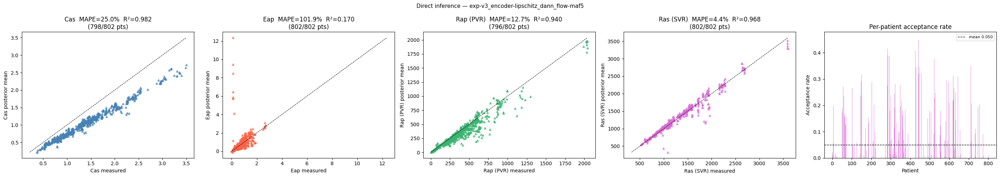


Parameter        MAPE      R²
------------------------------
Cas             25.0%   0.982
Eap            101.9%   0.170
Rap(PVR)        12.7%   0.940
Ras(SVR)         4.4%   0.968


In [58]:
from scipy.stats import pearsonr

cas_gt = np.array([pat['gt'].get('Cas', np.nan) for pat in patients])
eap_gt = np.array([pat['gt'].get('Eap', np.nan) for pat in patients])
rap_gt = np.array([pat['gt'].get('PVR', np.nan) for pat in patients])
ras_gt = np.array([pat['gt'].get('SVR', np.nan) for pat in patients])

fig, axes = plt.subplots(1, 5, figsize=(28, 5))
for ax, pred, gt, name, color in [
    (axes[0], cas_d, cas_gt, 'Cas',       'steelblue'),
    (axes[1], eap_d, eap_gt, 'Eap',       'tomato'),
    (axes[2], rap_d, rap_gt, 'Rap (PVR)', 'mediumseagreen'),
    (axes[3], ras_d, ras_gt, 'Ras (SVR)', 'orchid'),
]:
    valid = ~np.isnan(pred) & ~np.isnan(gt) & (gt >= 0)
    if valid.any():
        lo = np.nanmin([gt[valid].min(), pred[valid].min()])
        hi = np.nanmax([gt[valid].max(), pred[valid].max()])
        ax.scatter(gt[valid], pred[valid], s=15, alpha=0.7, color=color, marker='^')
        ax.plot([lo, hi], [lo, hi], 'k--', linewidth=0.8)
        mape = np.nanmean(np.abs(pred[valid] - gt[valid]) / (np.abs(gt[valid]) + 1e-9)) * 100
        r2   = pearsonr(gt[valid], pred[valid])[0] ** 2
        ax.set_title(f'{name}  MAPE={mape:.1f}%  R²={r2:.3f}\n({valid.sum()}/{len(patients)} pts)')
    else:
        ax.set_title(f'{name}  0 valid')
    ax.set_xlabel(f'{name} measured'); ax.set_ylabel(f'{name} posterior mean')

ax = axes[4]
ax.bar(range(len(patients)), accept_rates, color='orchid', alpha=0.8)
ax.axhline(accept_rates.mean(), color='black', linestyle='--', linewidth=1,
           label=f'mean {accept_rates.mean():.3f}')
ax.set_xlabel('Patient'); ax.set_ylabel('Acceptance rate')
ax.set_title('Per-patient acceptance rate'); ax.legend(fontsize=8)

fig.suptitle(f'Direct inference — {RUN}', fontsize=11)
plt.tight_layout(); plt.show()

print(f'\n{"Parameter":<12} {"MAPE":>8} {"R²":>7}')
print('-' * 30)
for pred, gt, name in [
    (cas_d, cas_gt, 'Cas'), (eap_d, eap_gt, 'Eap'),
    (rap_d, rap_gt, 'Rap(PVR)'), (ras_d, ras_gt, 'Ras(SVR)'),
]:
    valid = ~np.isnan(pred) & ~np.isnan(gt) & (gt >= 0)
    if valid.sum() > 1:
        mape = np.nanmean(np.abs(pred[valid] - gt[valid]) / (np.abs(gt[valid]) + 1e-9)) * 100
        r2   = pearsonr(gt[valid], pred[valid])[0] ** 2
        print(f'{name:<12} {mape:>7.1f}%  {r2:>6.3f}')

## 1-NN flow proxy — unseen simulations as observation stand-ins

Instead of running the flow on `encoder(x_real)`, find the 1 nearest simulation in latent space
from a bank of **unseen sims** (indices beyond what training used), then run the flow conditioned
on that sim's encoding. The proxy sim is guaranteed to be in the flow's training distribution,
but the specific sim was never seen during training.

- Bank start index read from `run_info_v{VERSION}.json` → guarantees no overlap with training
- Bank encodings cached to `knn_proxy_bank.npz` for fast reloading
- 1-NN distance printed as a diagnostic: small = good latent alignment
- Flow posterior sampled on `encoder(x_proxy_sim)` — same 1000 samples as direct inference

In [59]:
from sklearn.neighbors import NearestNeighbors

N_PROXY     = 50_000
PROXY_CACHE = RUN_DIR / 'knn_proxy_bank.npz'

# Read n_sims from run_info so proxy bank never overlaps training data
run_info_path = RUN_DIR / f'run_info_v{VERSION}.json'
with open(run_info_path) as f:
    run_info = json.load(f)
PROXY_START = run_info['data']['n_sims']
print(f'Training used {PROXY_START} sims → proxy bank starts at index {PROXY_START}')
print(f'Manifest has {len(manifest["index"])} total entries; proxy headroom: {len(manifest["index"]) - PROXY_START}')

if PROXY_CACHE.exists():
    loaded           = np.load(PROXY_CACHE)
    z_proxy_bank     = loaded['z_bank']
    theta_proxy_bank = loaded['theta_bank']
    print(f'Loaded proxy bank from cache: {z_proxy_bank.shape}')
else:
    proxy_entries = manifest['index'][PROXY_START : PROXY_START + N_PROXY]
    assert len(proxy_entries) >= N_PROXY, f'Not enough unseen sims: {len(proxy_entries)}'
    print(f'Encoding {N_PROXY} unseen sims (indices {PROXY_START}–{PROXY_START + N_PROXY})...')

    ds_proxy = ReducedCVDataset(str(SIM_ROOT / 'train'), proxy_entries, stats)
    theta_list, x_list = [], []
    for i in range(len(ds_proxy)):
        th, xb = ds_proxy[i]
        theta_list.append(th)
        x_list.append(xb)
    ds_proxy.close()
    theta_proxy_bank = torch.stack(theta_list).numpy()   # (N_PROXY, 24) raw sim units
    x_proxy          = torch.stack(x_list)               # (N_PROXY, 809)

    z_parts = []
    with torch.no_grad():
        for i in range(0, len(x_proxy), 256):
            z_parts.append(encoder(x_proxy[i:i+256].to(device)).cpu().numpy())
            if (i // 256) % 20 == 0:
                print(f'  {min(i+256, N_PROXY)}/{N_PROXY}', end='\r', flush=True)
    z_proxy_bank = np.concatenate(z_parts)   # (N_PROXY, 128)

    np.savez(PROXY_CACHE, z_bank=z_proxy_bank, theta_bank=theta_proxy_bank)
    print(f'\nSaved → {PROXY_CACHE}')

print(f'z_proxy_bank: {z_proxy_bank.shape}   theta_proxy_bank: {theta_proxy_bank.shape}')

Training used 300000 sims → proxy bank starts at index 300000
Manifest has 9900000 total entries; proxy headroom: 9600000
Loaded proxy bank from cache: (50000, 128)
z_proxy_bank: (50000, 128)   theta_proxy_bank: (50000, 24)


In [60]:
# Build 1-NN index and find nearest proxy sim for each real patient
knn_index = NearestNeighbors(n_neighbors=1, metric='euclidean', algorithm='auto', n_jobs=-1)
knn_index.fit(z_proxy_bank)
nn_dists_raw, nn_idx = knn_index.kneighbors(z_real)   # z_real from latent-space section: (802, 128)
nn_idx      = nn_idx[:, 0]                             # (802,)
nn_dists    = nn_dists_raw[:, 0]                       # (802,)
nn_z_proxy  = z_proxy_bank[nn_idx]                    # (802, 128) — proxy latents

print(f'1-NN distances (real → proxy sim):')
print(f'  mean={nn_dists.mean():.3f}  median={np.median(nn_dists):.3f}  '
      f'p95={np.percentile(nn_dists, 95):.3f}  max={nn_dists.max():.3f}')

# Compare to sim-to-sim distances as reference
sim_dists_ref = np.linalg.norm(z_proxy_bank[:500, None] - z_proxy_bank[None, :500], axis=2)
np.fill_diagonal(sim_dists_ref, np.inf)
nn_sim_dists = sim_dists_ref.min(axis=1)
print(f'1-NN distances (sim → sim, 500-sample ref):')
print(f'  mean={nn_sim_dists.mean():.3f}  median={np.median(nn_sim_dists):.3f}  '
      f'p95={np.percentile(nn_sim_dists, 95):.3f}')

# Run flow conditioned on proxy sim latent (not on x_real directly)
print(f'\nFlow inference on 1-NN proxy sims ({N_POSTERIOR_SAMPLES} samples/patient)...')
cas_nn, eap_nn, rap_nn, ras_nn = [], [], [], []
theta_means_nn = []
rap_nn_samples_all, ras_nn_samples_all = [], []
t0 = time.time()

for pi in range(len(patients)):
    z_pt = torch.from_numpy(nn_z_proxy[pi]).float().unsqueeze(0).to(device)  # (1, 128)
    with torch.no_grad():
        samples = flow_net.sample((N_POSTERIOR_SAMPLES,), condition=z_pt).squeeze(1).cpu()  # (N, 24)
    in_prior = ((samples >= lo_t) & (samples <= hi_t)).all(dim=1)
    s_ok  = samples[in_prior] if in_prior.any() else samples
    means = s_ok.mean(0).numpy()
    theta_means_nn.append(means)
    cas_nn.append(means[cas_idx]); eap_nn.append(means[eap_idx])
    rap_nn.append(means[rap_idx]); ras_nn.append(means[ras_idx])
    rap_nn_samples_all.append(samples[:, rap_idx].numpy())
    ras_nn_samples_all.append(samples[:, ras_idx].numpy())
    if pi % 100 == 0:
        print(f'  [{pi:3d}]  ({time.time()-t0:.0f}s)', end='\r', flush=True)

cas_nn = np.array(cas_nn); eap_nn = np.array(eap_nn)
rap_nn = np.array(rap_nn); ras_nn = np.array(ras_nn)
theta_means_nn     = np.stack(theta_means_nn)
rap_nn_samples_all = np.stack(rap_nn_samples_all)
ras_nn_samples_all = np.stack(ras_nn_samples_all)
print(f'\nDone.')

1-NN distances (real → proxy sim):
  mean=0.617  median=0.568  p95=0.952  max=2.241
1-NN distances (sim → sim, 500-sample ref):
  mean=0.711  median=0.703  p95=0.946

Flow inference on 1-NN proxy sims (1000 samples/patient)...
  [800]  (43s)
Done.


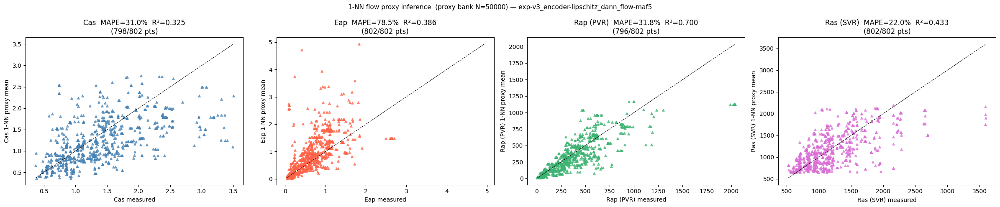


Parameter     Direct MAPE  Direct R²   1-NN MAPE   1-NN R²
----------------------------------------------------------
Cas                 25.0%      0.982        31.0%     0.325
Eap                101.9%      0.170        78.5%     0.386
Rap(PVR)            12.7%      0.940        31.8%     0.700
Ras(SVR)             4.4%      0.968        22.0%     0.433


In [61]:
fig, axes = plt.subplots(1, 4, figsize=(24, 5))
for ax, pred, gt, name, color in [
    (axes[0], cas_nn, cas_gt, 'Cas',       'steelblue'),
    (axes[1], eap_nn, eap_gt, 'Eap',       'tomato'),
    (axes[2], rap_nn, rap_gt, 'Rap (PVR)', 'mediumseagreen'),
    (axes[3], ras_nn, ras_gt, 'Ras (SVR)', 'orchid'),
]:
    valid = ~np.isnan(pred) & ~np.isnan(gt) & (gt >= 0)
    if valid.any():
        lo = np.nanmin([gt[valid].min(), pred[valid].min()])
        hi = np.nanmax([gt[valid].max(), pred[valid].max()])
        ax.scatter(gt[valid], pred[valid], s=15, alpha=0.7, color=color, marker='^')
        ax.plot([lo, hi], [lo, hi], 'k--', linewidth=0.8)
        mape = np.nanmean(np.abs(pred[valid] - gt[valid]) / (np.abs(gt[valid]) + 1e-9)) * 100
        r2   = pearsonr(gt[valid], pred[valid])[0] ** 2
        ax.set_title(f'{name}  MAPE={mape:.1f}%  R²={r2:.3f}\n({valid.sum()}/{len(patients)} pts)')
    else:
        ax.set_title(f'{name}  0 valid')
    ax.set_xlabel(f'{name} measured'); ax.set_ylabel(f'{name} 1-NN proxy mean')

fig.suptitle(f'1-NN flow proxy inference  (proxy bank N={N_PROXY}) — {RUN}', fontsize=11)
plt.tight_layout(); plt.show()

# Side-by-side comparison table: direct vs 1-NN proxy
print(f'\n{"Parameter":<12} {"Direct MAPE":>12} {"Direct R²":>10} {"1-NN MAPE":>11} {"1-NN R²":>9}')
print('-' * 58)
for pred_d, pred_nn, gt, name in [
    (cas_d, cas_nn, cas_gt, 'Cas'),
    (eap_d, eap_nn, eap_gt, 'Eap'),
    (rap_d, rap_nn, rap_gt, 'Rap(PVR)'),
    (ras_d, ras_nn, ras_gt, 'Ras(SVR)'),
]:
    valid_d  = ~np.isnan(pred_d)  & ~np.isnan(gt) & (gt >= 0)
    valid_nn = ~np.isnan(pred_nn) & ~np.isnan(gt) & (gt >= 0)
    md = np.nanmean(np.abs(pred_d[valid_d]   - gt[valid_d])   / (np.abs(gt[valid_d])   + 1e-9)) * 100
    rd = pearsonr(gt[valid_d],  pred_d[valid_d])[0]  ** 2
    mn = np.nanmean(np.abs(pred_nn[valid_nn] - gt[valid_nn]) / (np.abs(gt[valid_nn]) + 1e-9)) * 100
    rn = pearsonr(gt[valid_nn], pred_nn[valid_nn])[0] ** 2
    print(f'{name:<12} {md:>11.1f}%  {rd:>9.3f}  {mn:>10.1f}%  {rn:>8.3f}')

## Real patient calibration — Rap (PVR) and Ras (SVR)

For each patient, check whether the measured PVR/SVR falls within the posterior credible interval.
Unlike sim calibration (where true theta is exact), real GT has measurement noise — so expect
slightly looser calibration even from a perfect model.

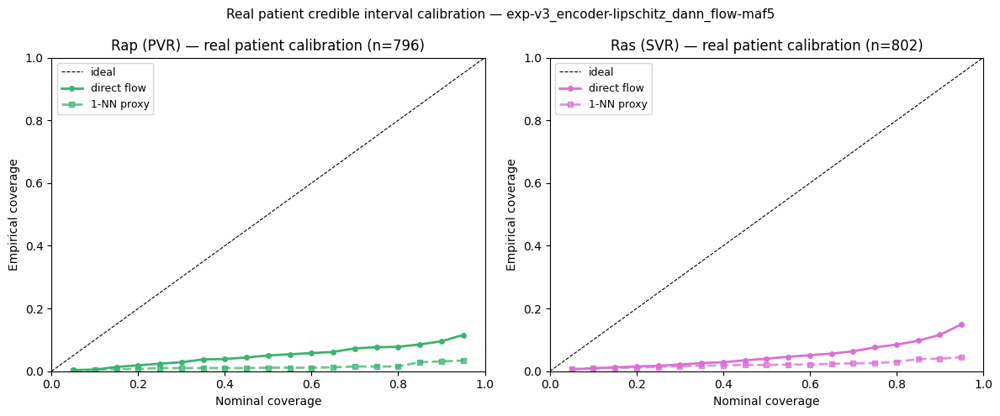

Coverage at 90% CI (ideal=0.90):
                       direct   1-NN proxy
  Rap (PVR)  (n=796)     0.095        0.031
  Ras (SVR)  (n=802)     0.116        0.040


In [62]:
alphas = np.linspace(0.05, 0.95, 19)

rap_valid = ~np.isnan(rap_gt) & (rap_gt >= 0)
ras_valid = ~np.isnan(ras_gt) & (ras_gt >= 0)

def coverage_curve(samples_all, gt, valid, alphas):
    cov = np.zeros(len(alphas))
    for ai, alpha in enumerate(alphas):
        lo_q, hi_q = (1 - alpha) / 2 * 100, (100 - (1 - alpha) / 2 * 100)
        lo = np.percentile(samples_all, lo_q, axis=1)
        hi = np.percentile(samples_all, hi_q, axis=1)
        cov[ai] = ((gt[valid] >= lo[valid]) & (gt[valid] <= hi[valid])).mean()
    return cov

rap_cov    = coverage_curve(rap_samples_all,    rap_gt, rap_valid, alphas)
ras_cov    = coverage_curve(ras_samples_all,    ras_gt, ras_valid, alphas)
rap_cov_nn = coverage_curve(rap_nn_samples_all, rap_gt, rap_valid, alphas)
ras_cov_nn = coverage_curve(ras_nn_samples_all, ras_gt, ras_valid, alphas)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for ax, cov, cov_nn, name, color, n_valid in [
    (axes[0], rap_cov, rap_cov_nn, 'Rap (PVR)', 'mediumseagreen', rap_valid.sum()),
    (axes[1], ras_cov, ras_cov_nn, 'Ras (SVR)', 'orchid',         ras_valid.sum()),
]:
    ax.plot([0, 1], [0, 1], 'k--', linewidth=0.8, label='ideal')
    ax.plot(alphas, cov,    color=color,     linewidth=2, marker='o', markersize=4, label='direct flow')
    ax.plot(alphas, cov_nn, color=color,     linewidth=2, marker='s', markersize=4,
            linestyle='--', alpha=0.75, label='1-NN proxy')
    ax.set_xlim(0, 1); ax.set_ylim(0, 1)
    ax.set_xlabel('Nominal coverage'); ax.set_ylabel('Empirical coverage')
    ax.set_title(f'{name} — real patient calibration (n={n_valid})')
    ax.legend(fontsize=9)

fig.suptitle(f'Real patient credible interval calibration — {RUN}', fontsize=11)
plt.tight_layout(); plt.show()

idx_90 = alphas.searchsorted(0.9)
print(f'Coverage at 90% CI (ideal=0.90):')
print(f'{"":20} {"direct":>8} {"1-NN proxy":>12}')
print(f'  Rap (PVR)  (n={rap_valid.sum()})  {rap_cov[idx_90]:>8.3f} {rap_cov_nn[idx_90]:>12.3f}')
print(f'  Ras (SVR)  (n={ras_valid.sum()})  {ras_cov[idx_90]:>8.3f} {ras_cov_nn[idx_90]:>12.3f}')

## Temperature scaling — real patient calibration

The coverage curves above sit well below the diagonal — the model is overconfident on real patients
(90% credible intervals capture far fewer than 90% of measured PVR/SVR values). This is a direct
consequence of the sim-to-real domain gap: the flow was trained on clean sim data and produces
posteriors that are too narrow for noisier real waveforms.

**Temperature scaling** broadens posteriors by a scalar T > 1 without retraining. Post-hoc
approximation: scale each patient's samples around their posterior mean:

    samples_T[i] = mean_i + T × (samples_i − mean_i)

This is exact for Gaussian posteriors and a good first-order approximation otherwise. T is fit
by minimising the mean squared deviation from the diagonal on the two parameters with real ground
truth: Rap (PVR) and Ras (SVR). The same T is then applied uniformly across all 24 parameters.

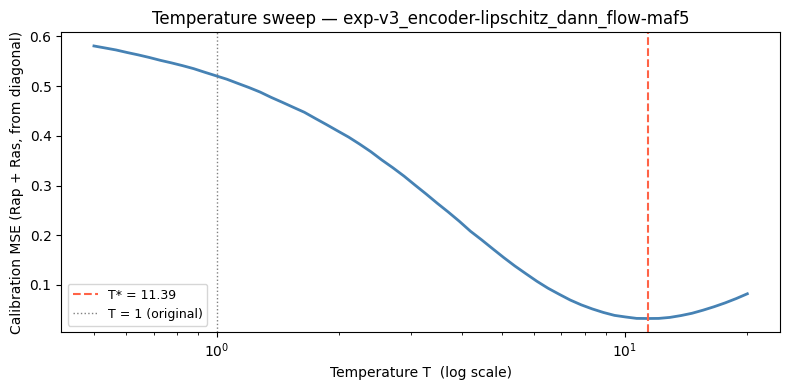

Optimal T* = 11.393


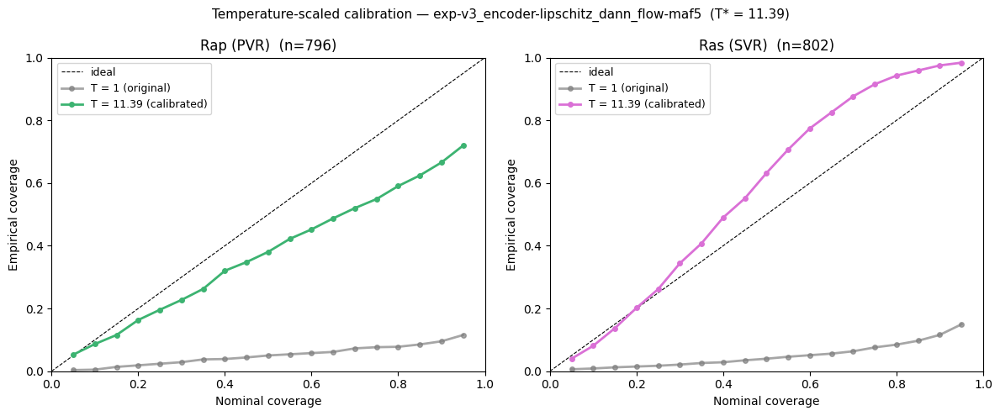

Coverage at 90% CI (ideal = 0.90):
                       T=1 (orig)     T*=11.39
  Rap (PVR)                 0.095        0.666
  Ras (SVR)                 0.116        0.975


In [63]:
def scaled_coverage(samples_all, gt, valid, alphas, T_temp):
    """Coverage curve after scaling samples around their per-patient mean by T_temp."""
    means = samples_all.mean(axis=1, keepdims=True)
    s_T   = means + T_temp * (samples_all - means)
    return coverage_curve(s_T, gt, valid, alphas)

# Sweep T on a log grid, minimise combined MSE from diagonal on Rap+Ras
T_grid = np.logspace(np.log10(0.5), np.log10(20.0), 60)
calib_errors = []
for T_val in T_grid:
    cov_r = scaled_coverage(rap_samples_all, rap_gt, rap_valid, alphas, T_val)
    cov_s = scaled_coverage(ras_samples_all, ras_gt, ras_valid, alphas, T_val)
    calib_errors.append(np.mean((cov_r - alphas)**2) + np.mean((cov_s - alphas)**2))
calib_errors = np.array(calib_errors)
T_star = T_grid[calib_errors.argmin()]

fig, ax = plt.subplots(figsize=(8, 4))
ax.semilogx(T_grid, calib_errors, color='steelblue', linewidth=2)
ax.axvline(T_star, color='tomato',  linestyle='--', linewidth=1.5, label=f'T* = {T_star:.2f}')
ax.axvline(1.0,    color='grey',    linestyle=':',  linewidth=1.0, label='T = 1 (original)')
ax.set_xlabel('Temperature T  (log scale)')
ax.set_ylabel('Calibration MSE (Rap + Ras, from diagonal)')
ax.set_title(f'Temperature sweep — {RUN}')
ax.legend(fontsize=9)
plt.tight_layout(); plt.show()
print(f'Optimal T* = {T_star:.3f}')

# Coverage curves at T*
rap_cov_T = scaled_coverage(rap_samples_all, rap_gt, rap_valid, alphas, T_star)
ras_cov_T = scaled_coverage(ras_samples_all, ras_gt, ras_valid, alphas, T_star)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for ax, cov_orig, cov_T, name, color, n_valid in [
    (axes[0], rap_cov, rap_cov_T, 'Rap (PVR)', 'mediumseagreen', rap_valid.sum()),
    (axes[1], ras_cov, ras_cov_T, 'Ras (SVR)', 'orchid',         ras_valid.sum()),
]:
    ax.plot([0, 1], [0, 1], 'k--', linewidth=0.8, label='ideal')
    ax.plot(alphas, cov_orig, color='grey',  linewidth=2, marker='o', markersize=4,
            alpha=0.7, label='T = 1 (original)')
    ax.plot(alphas, cov_T,    color=color,   linewidth=2, marker='o', markersize=4,
            label=f'T = {T_star:.2f} (calibrated)')
    ax.set_xlim(0, 1); ax.set_ylim(0, 1)
    ax.set_xlabel('Nominal coverage'); ax.set_ylabel('Empirical coverage')
    ax.set_title(f'{name}  (n={n_valid})')
    ax.legend(fontsize=9)

fig.suptitle(f'Temperature-scaled calibration — {RUN}  (T* = {T_star:.2f})', fontsize=11)
plt.tight_layout(); plt.show()

idx_90 = alphas.searchsorted(0.9)
print(f'Coverage at 90% CI (ideal = 0.90):')
print(f'{"":20} {"T=1 (orig)":>12} {f"T*={T_star:.2f}":>12}')
print(f'  Rap (PVR)          {rap_cov[idx_90]:>12.3f} {rap_cov_T[idx_90]:>12.3f}')
print(f'  Ras (SVR)          {ras_cov[idx_90]:>12.3f} {ras_cov_T[idx_90]:>12.3f}')

## Surrogate reconstruction from posterior

Run posterior theta samples through the cv-sbi-sim surrogate decoder (MLP, 25 params → 24 waves × 201 pts)
to get predicted waveforms, and compare against the 4 real observed channels (Prv, Pra, Pvp, Pap).

- **Plot 1** — posterior mean theta → surrogate → reconstructed waveform vs real (4 patients × 4 channels)
- **Plot 2** — envelope (P5–P95) from T=1 posterior samples, mean recon, real overlaid
- **Plot 3** — same with T=T* scaled samples (wider envelope; means unchanged since T scaling is centred)
- **Table** — per-channel MSE over all 802 patients (z-scored units)

Surrogate source: `cv-sbi-sim/outputs/exp-v1_mlp-surrogate_sims` (best val MSE=0.0255, R²≥0.875 all channels).

Surrogate loaded: SurrogateDecoder


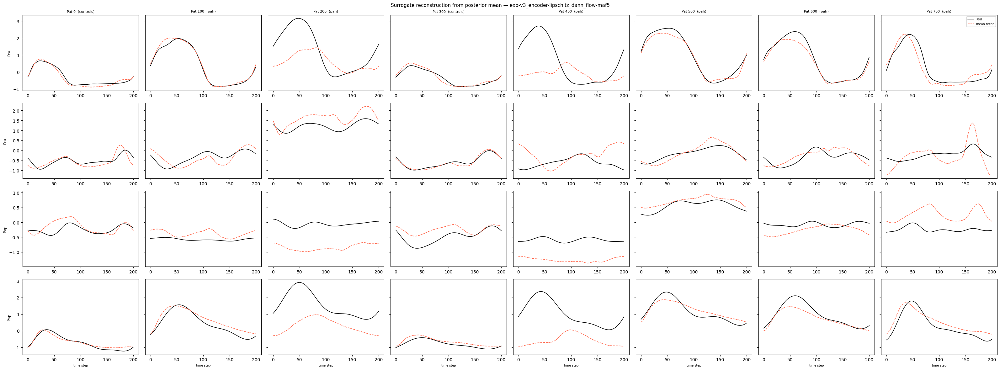

Sampling T=1 envelope (200 samples × 8 patients)...


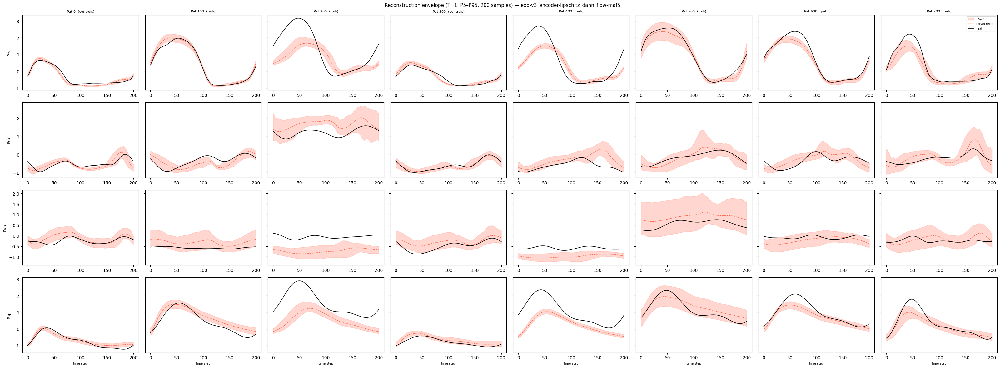

Sampling T=5 envelope...


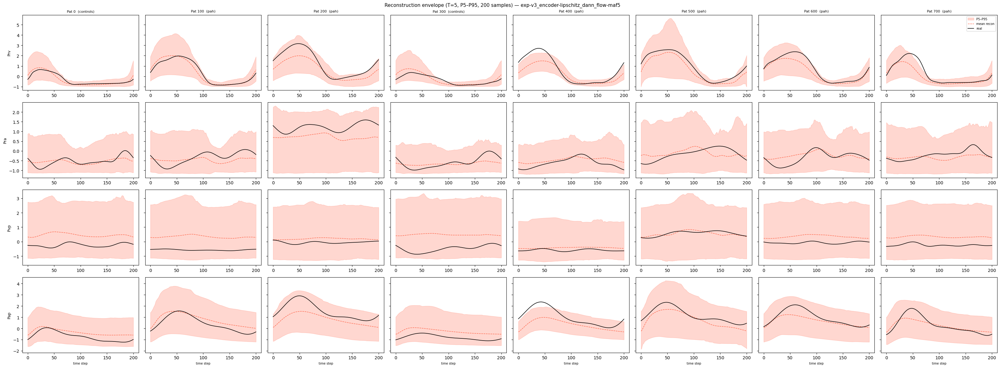

Sampling T=10 envelope...


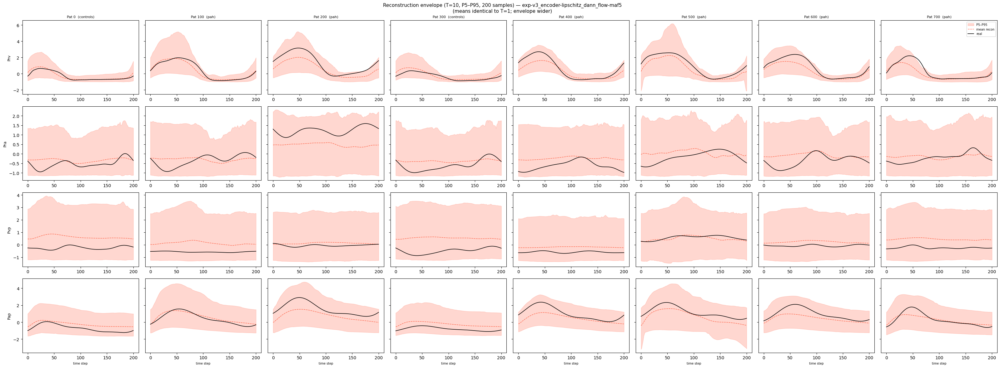


Surrogate reconstruction — posterior mean — all 802 patients  (z-scored units)
Channel       MSE     RMSE  Pearson r
----------------------------------------
Prv        0.7031   0.8385     0.7670
Pra        0.4849   0.6963     0.2991
Pvp        1.0760   1.0373     0.0768
Pap        1.0662   1.0326     0.7006

mean       0.8325   0.9012     0.4609

Per-patient MSE:   median=0.2206  p75=0.6756  p90=1.8460
Per-patient corr:  median=0.5377  p25=0.3070  p10=-0.0125


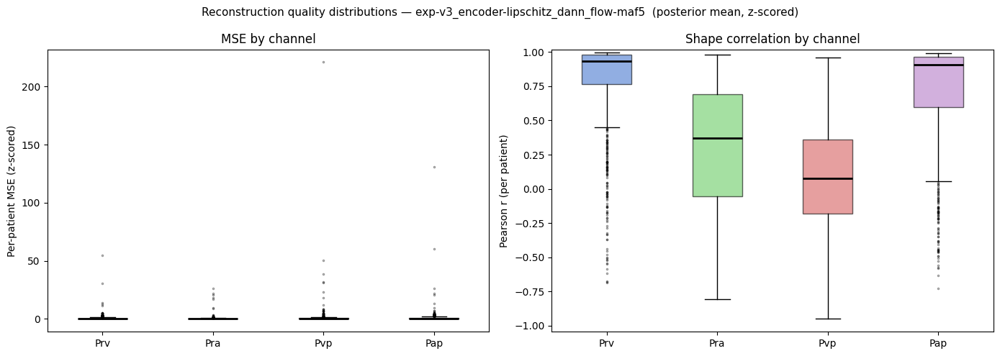

In [64]:
import importlib.util as _ilu

_spec = _ilu.spec_from_file_location("sbi_sim_models", "/home/sa4604/cv-sbi-sim/models.py")
_sbi_sim_models = _ilu.module_from_spec(_spec)
_spec.loader.exec_module(_sbi_sim_models)
SurrogateDecoder = _sbi_sim_models.SurrogateDecoder

SURROGATE_DIR  = Path('/home/sa4604/cv-sbi-sim/outputs/exp-v1_mlp-surrogate_sims')
N_SURR_SAMPLES = 200
N_EXAMPLES     = 8
T_RECON        = 10    # fixed temperature for calibrated envelope
N_T            = 201
t_axis         = np.arange(N_T)

# ── Load surrogate ────────────────────────────────────────────────────────────
decoder = SurrogateDecoder().to(device)
decoder.load_state_dict(
    torch.load(SURROGATE_DIR / 'decoder.pt', map_location=device, weights_only=True))
decoder.eval()

tn      = json.load(open(SURROGATE_DIR / 'theta_norm.json'))
tn_keys = tn['keys']
tn_mean = torch.tensor(tn['mean'], dtype=torch.float32, device=device)
tn_std  = torch.tensor(tn['std'],  dtype=torch.float32, device=device)

COMPARE_IDXS = [list(WAVE_KEYS_CONT).index(k) for k in WAVE_KEYS_REAL]
lo_np = lo_t.numpy()
hi_np = hi_t.numpy()

def build_theta25(theta_24_np, hr):
    t25 = np.empty(25, dtype=np.float32)
    for i, k in enumerate(tn_keys):
        t25[i] = float(hr) if k == 'HR' else theta_24_np[PARAM_KEYS_INFER.index(k)]
    return t25

def decode_batch(theta25_batch_np):
    """(N, 25) physical-unit theta → (N, 4, N_T) z-scored waveforms for WAVE_KEYS_REAL."""
    t = torch.from_numpy(theta25_batch_np).to(device)
    t = (t - tn_mean) / (tn_std + 1e-8)
    with torch.no_grad():
        out = decoder(t)  # (N, 24*201)
    out_np = out.cpu().numpy().reshape(len(theta25_batch_np), 24, N_T)
    return out_np[:, COMPARE_IDXS, :]  # (N, 4, N_T)

print('Surrogate loaded:', type(decoder).__name__)

# ── Real waveforms for all patients ──────────────────────────────────────────
real_waves_all = np.stack([
    pat['x_avg'][:len(WAVE_KEYS_REAL) * N_T].numpy().reshape(len(WAVE_KEYS_REAL), N_T)
    for pat in patients
])  # (802, 4, N_T)

# ── Mean-theta reconstruction for all 802 patients ────────────────────────────
hr_all      = np.array([float(pat['gt'].get('HR', np.nan)) for pat in patients])
theta25_all = np.stack([build_theta25(theta_means[pi], hr_all[pi]) for pi in range(len(patients))])
recon_mean  = decode_batch(theta25_all)  # (802, 4, N_T)

# ── Example patients: spread evenly across dataset ────────────────────────────
example_idxs   = [i * (len(patients) // N_EXAMPLES) for i in range(N_EXAMPLES)]
example_labels = [f'Pat {pi}  ({patients[pi]["gt"].get("cohort","?")})' for pi in example_idxs]

# ── Plot 1: posterior mean reconstruction vs real ─────────────────────────────
fig, axes = plt.subplots(len(WAVE_KEYS_REAL), N_EXAMPLES,
                         figsize=(4 * N_EXAMPLES, 3 * len(WAVE_KEYS_REAL)), sharey='row')
for ci, ch in enumerate(WAVE_KEYS_REAL):
    for ei, pi in enumerate(example_idxs):
        ax = axes[ci, ei]
        ax.plot(t_axis, real_waves_all[pi, ci], color='black',  lw=1.2, label='real')
        ax.plot(t_axis, recon_mean[pi, ci],      color='tomato', lw=1.2, ls='--', label='mean recon')
        if ci == 0:                        ax.set_title(example_labels[ei], fontsize=8)
        if ei == 0:                        ax.set_ylabel(ch, fontsize=9)
        if ci == len(WAVE_KEYS_REAL) - 1: ax.set_xlabel('time step', fontsize=7)
        if ci == 0 and ei == N_EXAMPLES - 1: ax.legend(fontsize=7)
fig.suptitle(f'Surrogate reconstruction from posterior mean — {RUN}', fontsize=11)
plt.tight_layout(); plt.show()

# ── Envelope helper ───────────────────────────────────────────────────────────
def sample_and_decode(ex_idxs, T_temp):
    all_recons = []
    for pi in ex_idxs:
        x = patients[pi]['x_avg'].unsqueeze(0).to(device)
        with torch.no_grad():
            z_pt  = encoder(x)
            s_raw = flow_net.sample((N_SURR_SAMPLES,), condition=z_pt).squeeze(1).cpu().numpy()
        mean_s = s_raw.mean(axis=0, keepdims=True)
        s_T    = np.clip(mean_s + T_temp * (s_raw - mean_s), lo_np, hi_np)
        hr     = float(patients[pi]['gt'].get('HR', hr_all[pi]))
        t25b   = np.stack([build_theta25(s_T[n], hr) for n in range(N_SURR_SAMPLES)])
        all_recons.append(decode_batch(t25b))
    return np.stack(all_recons)  # (N_ex, N_surr, 4, N_T)

def plot_envelope(env, axes):
    for ci, ch in enumerate(WAVE_KEYS_REAL):
        for ei, pi in enumerate(example_idxs):
            ax = axes[ci, ei]
            e  = env[ei, :, ci, :]
            ax.fill_between(t_axis, np.percentile(e, 5, axis=0), np.percentile(e, 95, axis=0),
                            alpha=0.25, color='tomato', label='P5–P95')
            ax.plot(t_axis, e.mean(axis=0),         color='tomato', lw=1.0, ls='--', label='mean recon')
            ax.plot(t_axis, real_waves_all[pi, ci], color='black',  lw=1.2,          label='real')
            if ci == 0:                        ax.set_title(example_labels[ei], fontsize=8)
            if ei == 0:                        ax.set_ylabel(ch, fontsize=9)
            if ci == len(WAVE_KEYS_REAL) - 1: ax.set_xlabel('time step', fontsize=7)
            if ci == 0 and ei == N_EXAMPLES - 1: ax.legend(fontsize=7)

# ── Plot 2: T=1 envelope ──────────────────────────────────────────────────────
print(f'Sampling T=1 envelope ({N_SURR_SAMPLES} samples × {N_EXAMPLES} patients)...')
env_T1 = sample_and_decode(example_idxs, T_temp=1.0)
fig, axes = plt.subplots(len(WAVE_KEYS_REAL), N_EXAMPLES,
                         figsize=(4 * N_EXAMPLES, 3 * len(WAVE_KEYS_REAL)), sharey='row')
plot_envelope(env_T1, axes)
fig.suptitle(f'Reconstruction envelope (T=1, P5–P95, {N_SURR_SAMPLES} samples) — {RUN}', fontsize=11)
plt.tight_layout(); plt.show()

# ── Plot 3: T=5 envelope ──────────────────────────────────────────────────────
print(f'Sampling T=5 envelope...')
env_T5 = sample_and_decode(example_idxs, T_temp=5.0)
fig, axes = plt.subplots(len(WAVE_KEYS_REAL), N_EXAMPLES,
                         figsize=(4 * N_EXAMPLES, 3 * len(WAVE_KEYS_REAL)), sharey='row')
plot_envelope(env_T5, axes)
fig.suptitle(f'Reconstruction envelope (T=5, P5–P95, {N_SURR_SAMPLES} samples) — {RUN}', fontsize=11)
plt.tight_layout(); plt.show()

# ── Plot 4: T=10 envelope ─────────────────────────────────────────────────────
print(f'Sampling T={T_RECON} envelope...')
env_T10 = sample_and_decode(example_idxs, T_temp=T_RECON)
fig, axes = plt.subplots(len(WAVE_KEYS_REAL), N_EXAMPLES,
                         figsize=(4 * N_EXAMPLES, 3 * len(WAVE_KEYS_REAL)), sharey='row')
plot_envelope(env_T10, axes)
fig.suptitle(
    f'Reconstruction envelope (T={T_RECON}, P5–P95, {N_SURR_SAMPLES} samples) — {RUN}\n'
    f'(means identical to T=1; envelope wider)', fontsize=11)
plt.tight_layout(); plt.show()

# ── Per-patient metrics ───────────────────────────────────────────────────────
err        = recon_mean - real_waves_all                  # (802, 4, N_T)
pat_mse_ch = (err ** 2).mean(axis=2)                     # (802, 4)  per-patient per-channel MSE
pat_mse    = pat_mse_ch.mean(axis=1)                     # (802,)    mean across channels
pat_rmse   = np.sqrt(pat_mse)

# per-patient per-channel Pearson r (correlation over time axis)
pat_corr_ch = np.zeros((len(patients), len(WAVE_KEYS_REAL)))
for ci in range(len(WAVE_KEYS_REAL)):
    for pi in range(len(patients)):
        r = np.corrcoef(recon_mean[pi, ci], real_waves_all[pi, ci])[0, 1]
        pat_corr_ch[pi, ci] = r if np.isfinite(r) else 0.0
pat_corr = pat_corr_ch.mean(axis=1)                      # (802,) mean-channel corr per patient

# cohort split
pah_mask_r  = cohorts == 'pah'
ctrl_mask_r = cohorts == 'controls'

# ── MSE + Pearson r table ─────────────────────────────────────────────────────
mse_ch  = pat_mse_ch.mean(axis=0)
rmse_ch = np.sqrt(mse_ch)
corr_ch = pat_corr_ch.mean(axis=0)

print(f'\nSurrogate reconstruction — posterior mean — all {len(patients)} patients  (z-scored units)')
print(f'{"Channel":<8} {"MSE":>8} {"RMSE":>8} {"Pearson r":>10}')
print('-' * 40)
for ci, ch in enumerate(WAVE_KEYS_REAL):
    print(f'{ch:<8} {mse_ch[ci]:>8.4f} {rmse_ch[ci]:>8.4f} {corr_ch[ci]:>10.4f}')
print(f'\n{"mean":<8} {mse_ch.mean():>8.4f} {rmse_ch.mean():>8.4f} {corr_ch.mean():>10.4f}')
print(f'\nPer-patient MSE:   median={np.median(pat_mse):.4f}  p75={np.percentile(pat_mse,75):.4f}  p90={np.percentile(pat_mse,90):.4f}')
print(f'Per-patient corr:  median={np.median(pat_corr):.4f}  p25={np.percentile(pat_corr,25):.4f}  p10={np.percentile(pat_corr,10):.4f}')

# ── Distribution plots ────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax = axes[0]
data_mse = [pat_mse_ch[:, ci] for ci in range(len(WAVE_KEYS_REAL))]
bp = ax.boxplot(data_mse, tick_labels=list(WAVE_KEYS_REAL), patch_artist=True,
                flierprops=dict(marker='.', markersize=3, alpha=0.4))
colors_ch = ['#4878CF', '#6ACC65', '#D65F5F', '#B47CC7']
for patch, c in zip(bp['boxes'], colors_ch):
    patch.set_facecolor(c); patch.set_alpha(0.6)
for med in bp['medians']: med.set(color='black', linewidth=2)
ax.set_ylabel('Per-patient MSE (z-scored)'); ax.set_title('MSE by channel')

ax = axes[1]
data_corr = [pat_corr_ch[:, ci] for ci in range(len(WAVE_KEYS_REAL))]
bp = ax.boxplot(data_corr, tick_labels=list(WAVE_KEYS_REAL), patch_artist=True,
                flierprops=dict(marker='.', markersize=3, alpha=0.4))
for patch, c in zip(bp['boxes'], colors_ch):
    patch.set_facecolor(c); patch.set_alpha(0.6)
for med in bp['medians']: med.set(color='black', linewidth=2)
ax.set_ylabel('Pearson r (per patient)'); ax.set_title('Shape correlation by channel')
ax.set_ylim(None, 1.02)

fig.suptitle(f'Reconstruction quality distributions — {RUN}  (posterior mean, z-scored)', fontsize=11)
plt.tight_layout(); plt.show()

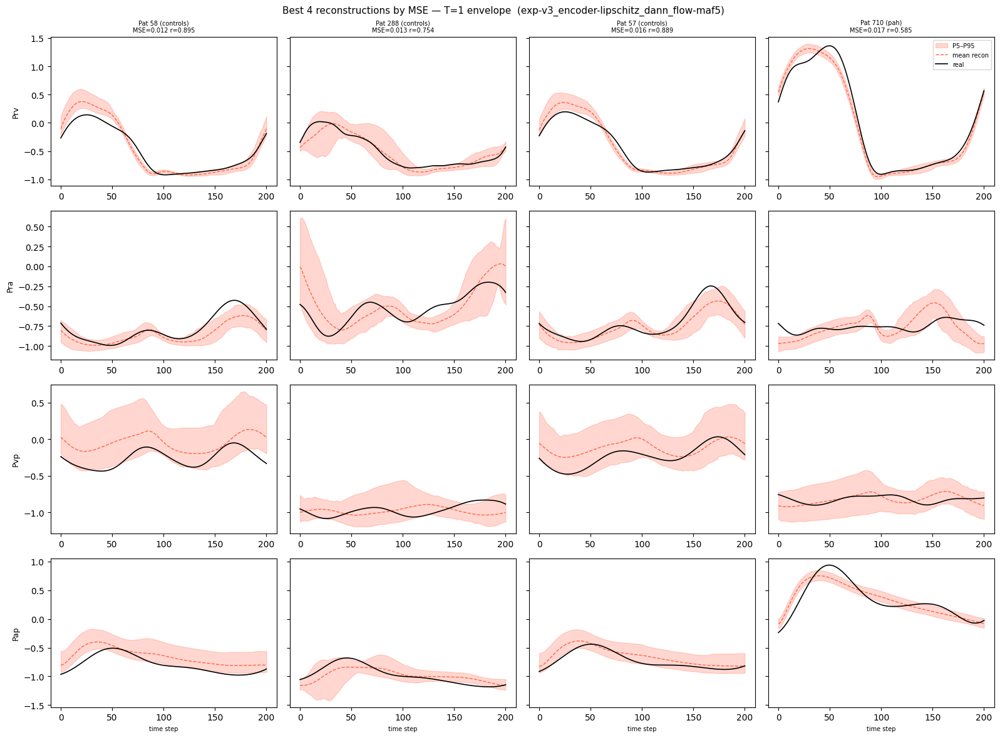

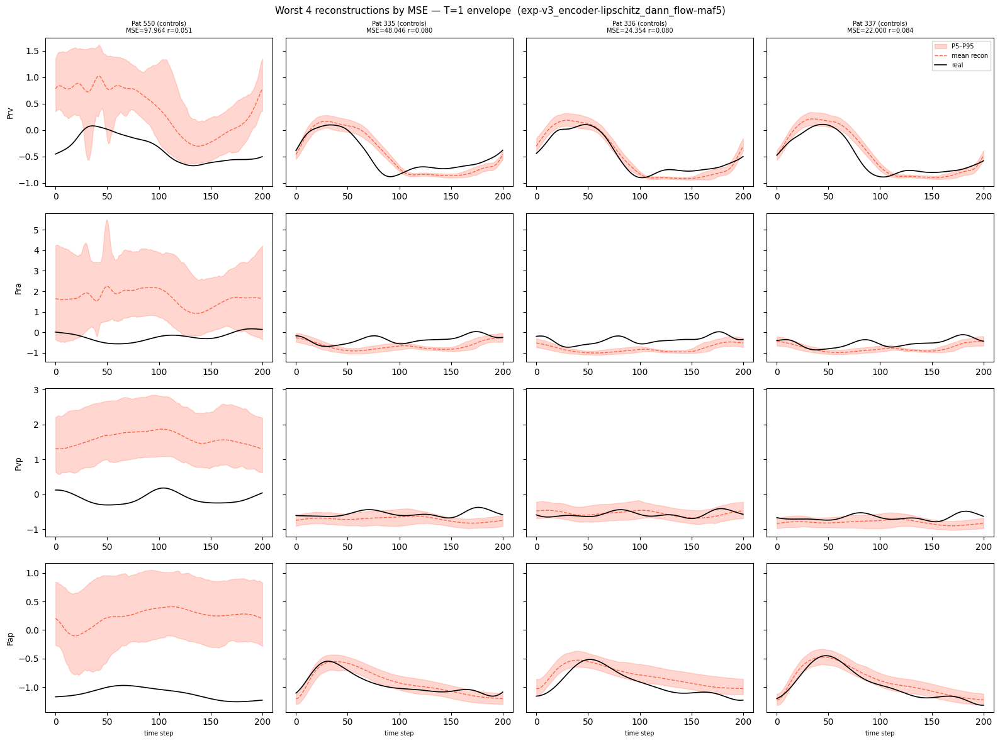

In [65]:
N_SHOW = 4  # patients to show for best and worst

best_idxs  = np.argsort(pat_mse)[:N_SHOW].tolist()
worst_idxs = np.argsort(pat_mse)[-N_SHOW:][::-1].tolist()

def make_label(pi):
    return f'Pat {pi} ({patients[pi]["gt"].get("cohort","?")})\nMSE={pat_mse[pi]:.3f} r={pat_corr[pi]:.3f}'

for group_idxs, title_tag in [(best_idxs, f'Best {N_SHOW}'), (worst_idxs, f'Worst {N_SHOW}')]:
    env = sample_and_decode(group_idxs, T_temp=1.0)
    fig, axes = plt.subplots(len(WAVE_KEYS_REAL), N_SHOW,
                             figsize=(4 * N_SHOW, 3 * len(WAVE_KEYS_REAL)), sharey='row')
    for ci, ch in enumerate(WAVE_KEYS_REAL):
        for ei, pi in enumerate(group_idxs):
            ax = axes[ci, ei]
            e  = env[ei, :, ci, :]
            ax.fill_between(t_axis, np.percentile(e, 5, axis=0), np.percentile(e, 95, axis=0),
                            alpha=0.25, color='tomato', label='P5–P95')
            ax.plot(t_axis, e.mean(axis=0),         color='tomato', lw=1.0, ls='--', label='mean recon')
            ax.plot(t_axis, real_waves_all[pi, ci], color='black',  lw=1.2,          label='real')
            if ci == 0:                        ax.set_title(make_label(pi), fontsize=7)
            if ei == 0:                        ax.set_ylabel(ch, fontsize=9)
            if ci == len(WAVE_KEYS_REAL) - 1: ax.set_xlabel('time step', fontsize=7)
            if ci == 0 and ei == N_SHOW - 1:  ax.legend(fontsize=7)
    fig.suptitle(f'{title_tag} reconstructions by MSE — T=1 envelope  ({RUN})', fontsize=11)
    plt.tight_layout(); plt.show()

## Parameter correlation heatmap

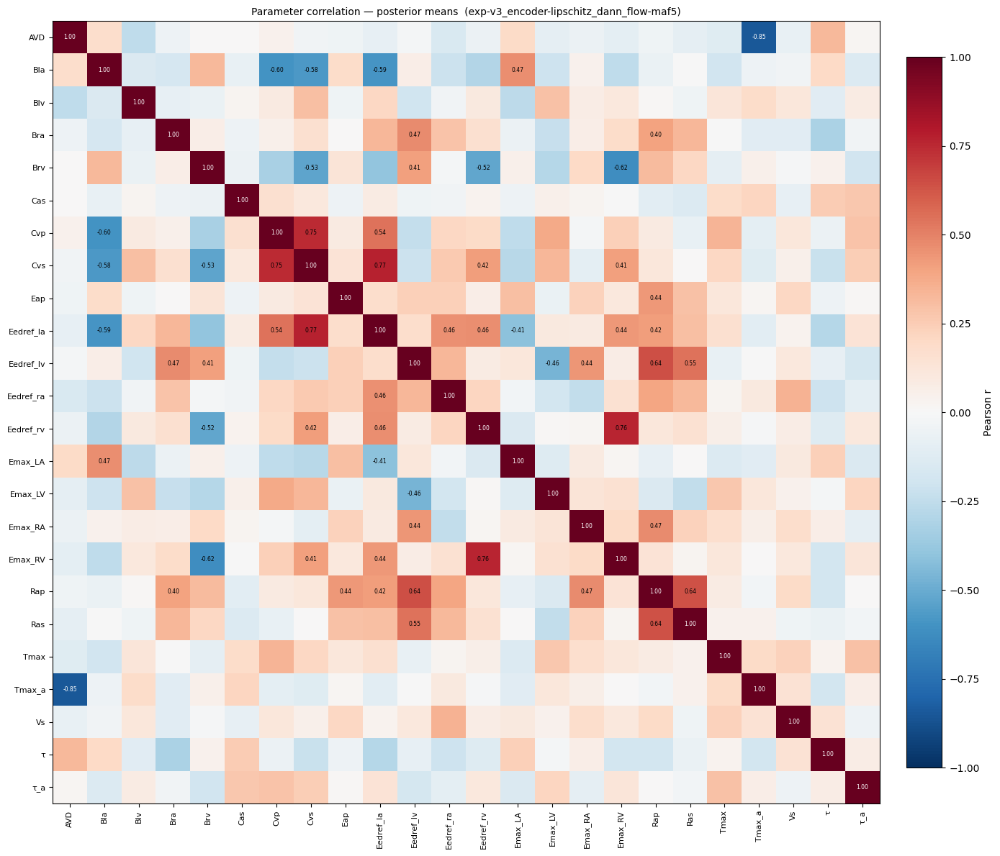

In [67]:
corr = np.corrcoef(theta_means.T)
fig, ax = plt.subplots(figsize=(14, 12))
im = ax.imshow(corr, cmap='RdBu_r', vmin=-1, vmax=1, aspect='auto')
plt.colorbar(im, ax=ax, fraction=0.04, pad=0.03, label='Pearson r')
ticks = range(len(PARAM_KEYS_INFER))
ax.set_xticks(ticks); ax.set_xticklabels(PARAM_KEYS_INFER, rotation=90, fontsize=8)
ax.set_yticks(ticks); ax.set_yticklabels(PARAM_KEYS_INFER, fontsize=8)
for i in range(len(PARAM_KEYS_INFER)):
    for j in range(len(PARAM_KEYS_INFER)):
        val = corr[i, j]
        if abs(val) > 0.4:
            ax.text(j, i, f'{val:.2f}', ha='center', va='center',
                    fontsize=5.5, color='black' if abs(val) < 0.8 else 'white')
ax.set_title(f'Parameter correlation — posterior means  ({RUN})', fontsize=10)
plt.tight_layout(); plt.show()

## PAH vs controls — key parameter estimates

Comparing posterior means for 4 parameters across PAH (n=629) and control (n=173) patients.

- **Rap** (PVR, R²=1.000): direct disease marker — should be clearly elevated in PAH
- **Ras** (SVR, R²=0.998): negative control — should be similar between groups
- **Emax_RV** (R²=0.974): RV contractile adaptation to elevated afterload — should be higher in compensated PAH
- **Tmax** (R²=0.988): RV contraction timing — may shift with elevated afterload

Rap (PVR):  controls=47.1290±33.2624  PAH=387.0834±272.5013  MWU p=0.0000  (Higher in PAH (disease definition))
Ras (SVR):  controls=1001.3880±243.6195  PAH=1302.6782±514.6365  MWU p=0.0000  (Should be similar (negative control))
Emax_RV:  controls=0.4807±0.2371  PAH=0.5978±0.4809  MWU p=0.0123  (Higher in compensated PAH (RV adaptation))
Tmax:  controls=259.0306±39.9751  PAH=270.3080±32.2010  MWU p=0.0000  (RV contraction timing)


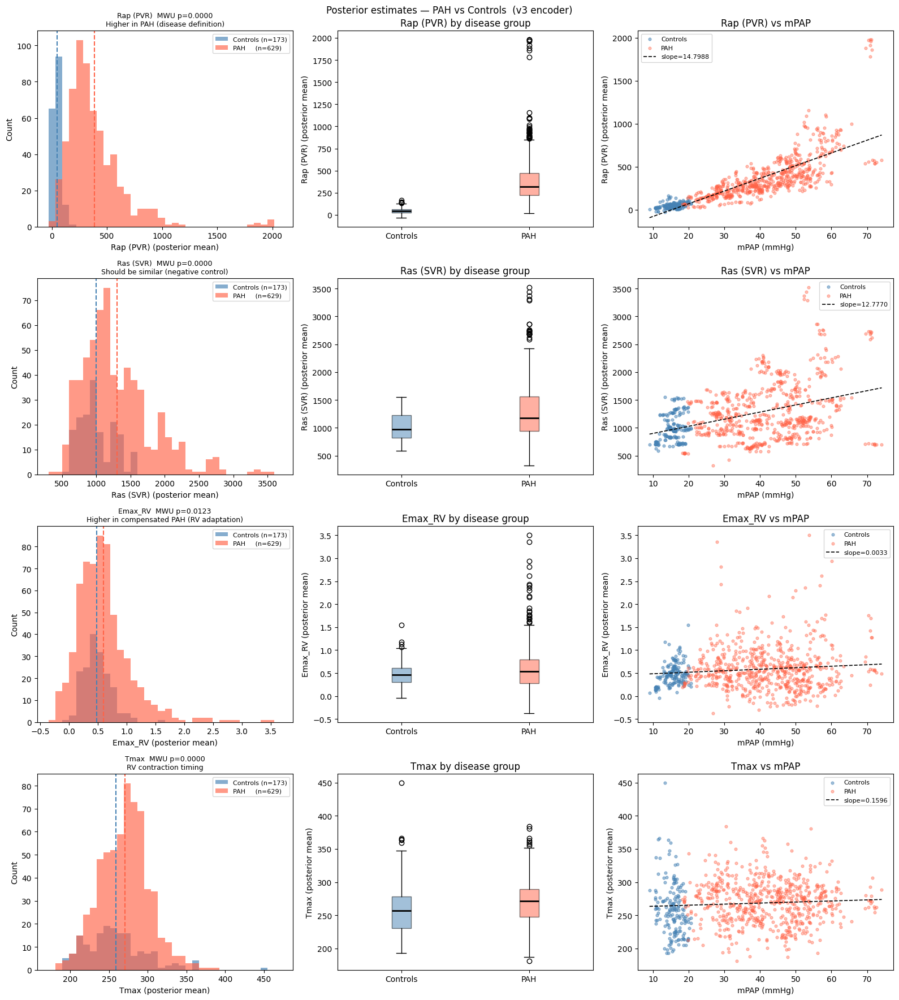

In [68]:
from scipy.stats import mannwhitneyu, ttest_ind

cohorts   = np.array([pat['gt'].get('cohort', '') for pat in patients])
pah_mask  = cohorts == 'pah'
ctrl_mask = cohorts == 'controls'
mpap_vals = np.array([pat['gt'].get('mpap', np.nan) for pat in patients])

PARAMS_TO_COMPARE = [
    ('Rap',     'Rap (PVR)',    'mediumseagreen', 'Higher in PAH (disease definition)'),
    ('Ras',     'Ras (SVR)',    'steelblue',      'Should be similar (negative control)'),
    ('Emax_RV', 'Emax_RV',     'tomato',         'Higher in compensated PAH (RV adaptation)'),
    ('Tmax',    'Tmax',        'orchid',          'RV contraction timing'),
]

fig, axes = plt.subplots(len(PARAMS_TO_COMPARE), 3,
                         figsize=(16, 4.5 * len(PARAMS_TO_COMPARE)))

for row, (pname, label, color, note) in enumerate(PARAMS_TO_COMPARE):
    pidx = PARAM_KEYS_INFER.index(pname)
    vals = theta_means[:, pidx]

    pah_v  = vals[pah_mask]
    ctrl_v = vals[ctrl_mask]
    p_mwu  = mannwhitneyu(pah_v, ctrl_v, alternative='two-sided').pvalue
    p_t    = ttest_ind(pah_v, ctrl_v).pvalue

    print(f'{label}:  controls={ctrl_v.mean():.4f}±{ctrl_v.std():.4f}  '
          f'PAH={pah_v.mean():.4f}±{pah_v.std():.4f}  '
          f'MWU p={p_mwu:.4f}  ({note})')

    # Histogram
    ax = axes[row, 0]
    bins = np.linspace(vals.min() * 0.95, vals.max() * 1.05, 35)
    ax.hist(ctrl_v, bins=bins, color='steelblue', alpha=0.65, label=f'Controls (n={ctrl_mask.sum()})')
    ax.hist(pah_v,  bins=bins, color='tomato',    alpha=0.65, label=f'PAH     (n={pah_mask.sum()})')
    ax.axvline(ctrl_v.mean(), color='steelblue', linestyle='--', linewidth=1.5)
    ax.axvline(pah_v.mean(),  color='tomato',    linestyle='--', linewidth=1.5)
    ax.set_xlabel(f'{label} (posterior mean)'); ax.set_ylabel('Count')
    ax.set_title(f'{label}  MWU p={p_mwu:.4f}\n{note}', fontsize=9)
    ax.legend(fontsize=8)

    # Box plot
    ax = axes[row, 1]
    bp = ax.boxplot([ctrl_v, pah_v], tick_labels=['Controls', 'PAH'], patch_artist=True)
    bp['boxes'][0].set_facecolor('steelblue'); bp['boxes'][0].set_alpha(0.5)
    bp['boxes'][1].set_facecolor('tomato');    bp['boxes'][1].set_alpha(0.5)
    for med in bp['medians']: med.set(color='black', linewidth=2)
    ax.set_ylabel(f'{label} (posterior mean)')
    ax.set_title(f'{label} by disease group')

    # Scatter vs mPAP
    ax = axes[row, 2]
    valid_mpap = ~np.isnan(mpap_vals)
    ax.scatter(mpap_vals[ctrl_mask & valid_mpap], vals[ctrl_mask & valid_mpap],
               s=12, alpha=0.5, color='steelblue', label='Controls')
    ax.scatter(mpap_vals[pah_mask  & valid_mpap], vals[pah_mask  & valid_mpap],
               s=12, alpha=0.4, color='tomato',    label='PAH')
    m, b = np.polyfit(mpap_vals[valid_mpap], vals[valid_mpap], 1)
    x_line = np.linspace(np.nanmin(mpap_vals), np.nanmax(mpap_vals), 100)
    ax.plot(x_line, m * x_line + b, 'k--', linewidth=1.2, label=f'slope={m:.4f}')
    ax.set_xlabel('mPAP (mmHg)'); ax.set_ylabel(f'{label} (posterior mean)')
    ax.set_title(f'{label} vs mPAP'); ax.legend(fontsize=8)

fig.suptitle('Posterior estimates — PAH vs Controls  (v3 encoder)', fontsize=12)
plt.tight_layout(); plt.show()

## Sim evaluation — posterior scatter, error metrics, and credible interval coverage

Uses held-out test sims (true theta known). For each sim: `encoder(x) → z → flow.sample(1000)`.
Posterior mean vs true theta gives MAPE/MAE/R²; posterior quantiles give coverage calibration.

In [70]:
N_SIM_EVAL = 1000
ncols, nrows = 6, 4

manifest_test = load_manifest(SIM_ROOT / 'manifest_test.json')
ds_test = ReducedCVDataset(str(SIM_ROOT / 'test'), manifest_test['index'][:N_SIM_EVAL], stats)
theta_test, x_test = zip(*[ds_test[i] for i in range(len(ds_test))])
ds_test.close()
theta_test = torch.stack(list(theta_test))  # (N, 24) — true parameters
x_test     = torch.stack(list(x_test))      # (N, obs_dim)
print(f'Test sims: {tuple(theta_test.shape)}  obs: {tuple(x_test.shape)}')

# Run posterior inference on each test sim
print(f'Running inference on {N_SIM_EVAL} test sims...')
sim_samples = []
t0 = time.time()
with torch.no_grad():
    for i in range(0, len(x_test), 64):
        x_b = x_test[i:i+64].to(device)
        z_b = encoder(x_b)
        for j in range(len(x_b)):
            s = flow_net.sample(
                (N_POSTERIOR_SAMPLES,), condition=z_b[j:j+1]
            ).squeeze(1).cpu()                    # (N, 24)
            sim_samples.append(s)
        if (i // 64) % 5 == 0:
            print(f'  {i+len(x_b)}/{N_SIM_EVAL}  ({time.time()-t0:.0f}s)', end='\r', flush=True)

sim_samples = torch.stack(sim_samples)            # (N_sims, N_posterior, 24)
sim_means   = sim_samples.mean(dim=1).numpy()     # (N_sims, 24)
theta_np    = theta_test.numpy()                  # (N_sims, 24)
print(f'\nDone. sim_samples: {tuple(sim_samples.shape)}')

Test sims: (1000, 24)  obs: (1000, 809)
Running inference on 1000 test sims...
  1000/1000  (44s)
Done. sim_samples: (1000, 1000, 24)


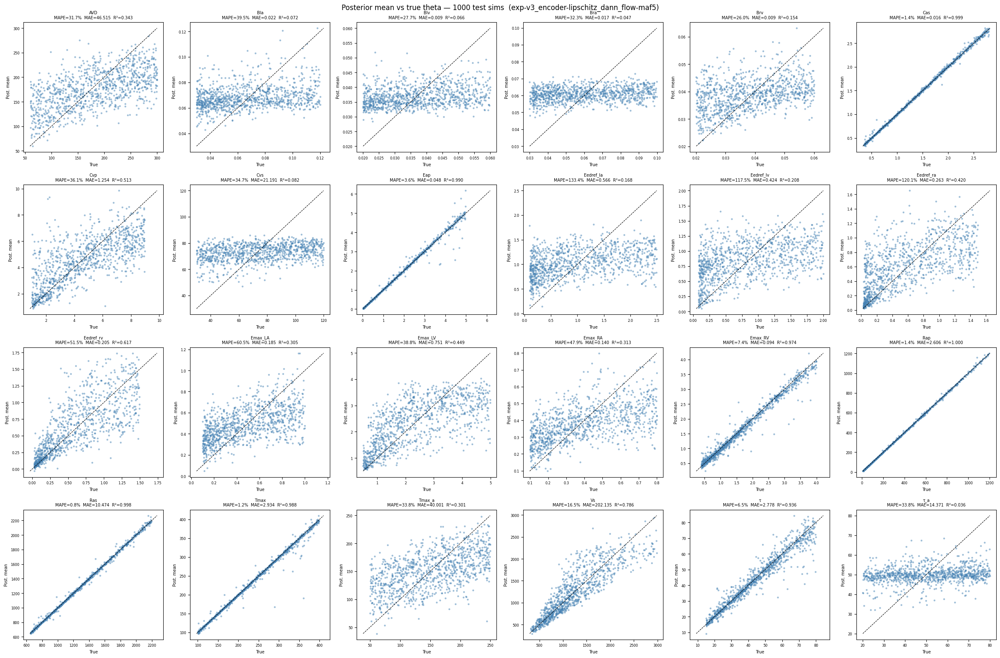


Param          MAPE        MAE      R²
--------------------------------------
AVD           31.7%    46.5150   0.343
Bla           39.5%     0.0218   0.072
Blv           27.7%     0.0092   0.066
Bra           32.3%     0.0172   0.047
Brv           26.0%     0.0087   0.154
Cas            1.4%     0.0161   0.999
Cvp           36.1%     1.2537   0.513
Cvs           34.7%    21.1914   0.082
Eap            3.6%     0.0477   0.990
Eedref_la    133.4%     0.5663   0.168
Eedref_lv    117.5%     0.4239   0.208
Eedref_ra    120.1%     0.2634   0.420
Eedref_rv     51.5%     0.2047   0.617
Emax_LA       60.5%     0.1846   0.305
Emax_LV       38.8%     0.7512   0.449
Emax_RA       47.9%     0.1403   0.313
Emax_RV        7.4%     0.0941   0.974
Rap            1.4%     2.6059   1.000
Ras            0.8%    10.4741   0.998
Tmax           1.2%     2.9345   0.988
Tmax_a        33.8%    40.0006   0.301
Vs            16.5%   202.1348   0.786
τ              6.5%     2.7778   0.936
τ_a           33.8%    1

In [71]:
# Scatter plots — posterior mean vs true theta for all 24 params
ncols, nrows = 6, 4
fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 4 * nrows))

for i, name in enumerate(PARAM_KEYS_INFER):
    ax   = axes[i // ncols, i % ncols]
    pred = sim_means[:, i]
    true = theta_np[:, i]
    lo   = min(true.min(), pred.min())
    hi   = max(true.max(), pred.max())
    ax.scatter(true, pred, s=5, alpha=0.4, color='steelblue', rasterized=True)
    ax.plot([lo, hi], [lo, hi], 'k--', linewidth=0.8)
    mape = np.mean(np.abs(pred - true) / (np.abs(true) + 1e-9)) * 100
    mae  = np.mean(np.abs(pred - true))
    r2   = pearsonr(true, pred)[0] ** 2
    ax.set_title(f'{name}\nMAPE={mape:.1f}%  MAE={mae:.3f}  R²={r2:.3f}', fontsize=7)
    ax.set_xlabel('True', fontsize=7); ax.set_ylabel('Post. mean', fontsize=7)
    ax.tick_params(labelsize=6)

for i in range(len(PARAM_KEYS_INFER), nrows * ncols):
    axes[i // ncols, i % ncols].axis('off')

fig.suptitle(f'Posterior mean vs true theta — {N_SIM_EVAL} test sims  ({RUN})', fontsize=12)
plt.tight_layout(); plt.show()

# Error metrics table
print(f'\n{"Param":<10} {"MAPE":>8} {"MAE":>10} {"R²":>7}')
print('-' * 38)
for i, name in enumerate(PARAM_KEYS_INFER):
    pred = sim_means[:, i]; true = theta_np[:, i]
    mape = np.mean(np.abs(pred - true) / (np.abs(true) + 1e-9)) * 100
    mae  = np.mean(np.abs(pred - true))
    r2   = pearsonr(true, pred)[0] ** 2
    print(f'{name:<10} {mape:>7.1f}%  {mae:>9.4f}  {r2:>6.3f}')

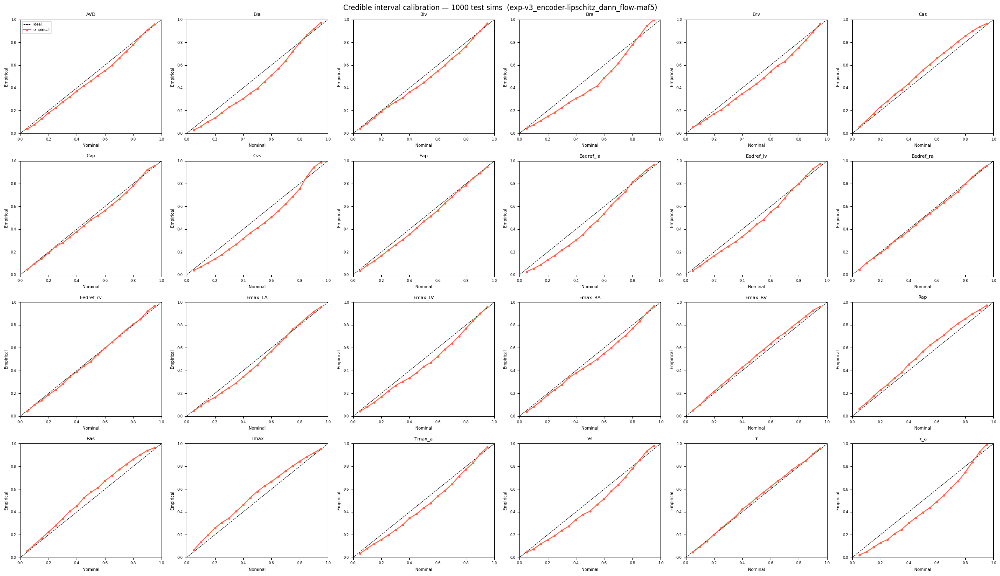

Coverage at 90% CI (ideal=0.90):
  mean=0.919  min=0.890 (Brv)  max=0.944 (Cvs)

Param        90% CI coverage
------------------------------
AVD                   0.908
Bla                   0.918
Blv                   0.899
Bra                   0.942
Brv                   0.890
Cas                   0.935
Cvp                   0.923
Cvs                   0.944
Eap                   0.893
Eedref_la             0.922
Eedref_lv             0.929
Eedref_ra             0.910
Eedref_rv             0.920
Emax_LA               0.918
Emax_LV               0.901
Emax_RA               0.905
Emax_RV               0.928
Rap                   0.931
Ras                   0.940
Tmax                  0.918
Tmax_a                0.909
Vs                    0.932
τ                     0.910
τ_a                   0.923


In [72]:
# Credible interval coverage calibration
# For each nominal level alpha, check what fraction of sims have true theta inside the alpha-CI.
# Perfect calibration = empirical coverage matches nominal (points on diagonal).

alphas    = np.linspace(0.05, 0.95, 19)
sim_s_np  = sim_samples.numpy()   # (N_sims, N_posterior, 24)
coverage  = np.zeros((len(alphas), len(PARAM_KEYS_INFER)))  # (n_levels, 24)

for ai, alpha in enumerate(alphas):
    lo_q = (1 - alpha) / 2 * 100
    hi_q = 100 - lo_q
    ci_lo = np.percentile(sim_s_np, lo_q, axis=1)  # (N_sims, 24)
    ci_hi = np.percentile(sim_s_np, hi_q, axis=1)
    inside = (theta_np >= ci_lo) & (theta_np <= ci_hi)  # (N_sims, 24)
    coverage[ai] = inside.mean(axis=0)

# Per-parameter calibration curves (4×6 grid)
fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 3.5 * nrows))
for i, name in enumerate(PARAM_KEYS_INFER):
    ax = axes[i // ncols, i % ncols]
    ax.plot([0, 1], [0, 1], 'k--', linewidth=0.8, label='ideal')
    ax.plot(alphas, coverage[:, i], color='tomato', linewidth=1.5, marker='o', markersize=3, label='empirical')
    ax.set_xlim(0, 1); ax.set_ylim(0, 1)
    ax.set_title(name, fontsize=8)
    ax.set_xlabel('Nominal', fontsize=7); ax.set_ylabel('Empirical', fontsize=7)
    ax.tick_params(labelsize=6)
    if i == 0: ax.legend(fontsize=6)
for i in range(len(PARAM_KEYS_INFER), nrows * ncols):
    axes[i // ncols, i % ncols].axis('off')
fig.suptitle(f'Credible interval calibration — {N_SIM_EVAL} test sims  ({RUN})', fontsize=12)
plt.tight_layout(); plt.show()

# Summary: mean coverage at 90% CI across all params
cov_90 = coverage[alphas.searchsorted(0.9), :]
print(f'Coverage at 90% CI (ideal=0.90):')
print(f'  mean={cov_90.mean():.3f}  min={cov_90.min():.3f} ({PARAM_KEYS_INFER[cov_90.argmin()]})  '
      f'max={cov_90.max():.3f} ({PARAM_KEYS_INFER[cov_90.argmax()]})')
print(f'\n{"Param":<10} {"90% CI coverage":>17}')
print('-' * 30)
for i, name in enumerate(PARAM_KEYS_INFER):
    flag = '  ← overconfident' if cov_90[i] < 0.80 else ('  ← underconfident' if cov_90[i] > 0.97 else '')
    print(f'{name:<10} {cov_90[i]:>16.3f}{flag}')

---
## SV ablation: v3 (with SV) vs v3_nosv (no SV) on real patients

Tests whether removing the SV scalar from the observation hurts SV recovery.
SV is derived via the S1 surrogate using **Vrv** (right ventricular volume) — matching
thermodilution GT which measures right-heart cardiac output.

In [73]:
import importlib.util, time

ROOT_SIM = Path('/home/sa4604/cv-sbi-sim')
OUT_V3_NOSV = ROOT / 'outputs/exp-v3_nosv_encoder-lipschitz_dann_flow-maf5'
OUT_S1      = ROOT_SIM / 'outputs/exp-v1_mlp-surrogate_sims'

# Load v3_nosv encoder + flow
enc_nosv = LipschitzReducedAutoencoderEncoder(latent_dim=128, n_scalars=4).to(device)
enc_nosv.load_state_dict(torch.load(OUT_V3_NOSV / 'encoder.pt', map_location=device))
enc_nosv.eval()
flow_nosv = torch.load(OUT_V3_NOSV / 'flow_net.pt', map_location=device, weights_only=False)
flow_nosv.eval()
print('v3_nosv encoder:', enc_nosv.describe())

# Load S1 surrogate from cv-sbi-sim
_spec = importlib.util.spec_from_file_location('sim_models', ROOT_SIM / 'models.py')
_sim  = importlib.util.module_from_spec(_spec); _spec.loader.exec_module(_sim)
SurrogateDecoder = _sim.SurrogateDecoder

with open(OUT_S1 / 'theta_norm.json') as _f:
    _tn = json.load(_f)
theta_norm_mean = torch.tensor(_tn['mean'], dtype=torch.float32).to(device)
theta_norm_std  = torch.tensor(_tn['std'],  dtype=torch.float32).to(device)

surrogate = SurrogateDecoder(hidden=512, n_layers=4).to(device)
surrogate.load_state_dict(torch.load(OUT_S1 / 'decoder.pt', map_location=device))
surrogate.eval()

vrv_idx = WAVE_KEYS_CONT.index('Vrv')
vrv_std = stats['waves']['Vrv']['std']
vlv_idx = WAVE_KEYS_CONT.index('Vlv')
vlv_std = stats['waves']['Vlv']['std']
HR_IDX  = 17  # position of HR in 25-param PARAM_KEYS
N_CONT  = len(WAVE_KEYS_CONT)  # 24

# Build 808-dim beats for v3_nosv (drop SV scalar at position 807)
# Observation layout: [wave(804), map(1), sbp(1), dbp(1), sv(1), hr(1)] = 809
# Drop sv => [wave(804), map(1), sbp(1), dbp(1), hr(1)] = 808
for pat in patients:
    x809 = pat['x_beats']          # (n_beats, 809)
    pat['x_beats_nosv'] = torch.cat([x809[:, :807], x809[:, 808:]], dim=1)   # (n_beats, 808)
    pat['x_avg_nosv']   = pat['x_beats_nosv'].mean(0)

print(f'v3_nosv obs dim: {patients[0]["x_avg_nosv"].shape[0]}')
print(f'Surrogate loaded. vrv_idx={vrv_idx}, vrv_std={vrv_std:.2f}')

v3_nosv encoder: {'type': 'LipschitzReducedAutoencoderEncoder', 'input_waveforms': '(4, 201)', 'input_scalars': 'Pas_mean, Pas_max, Pas_min, HR_z', 'latent_dim': 128, 'proj_hidden': None, 'sn_ceiling': 2.0, 'n_params': 439105}
v3_nosv obs dim: 808
Surrogate loaded. vrv_idx=21, vrv_std=35.26


In [74]:
# Run posterior inference for v3 and v3_nosv on all real patients
N_ABL = N_POSTERIOR_SAMPLES

def run_ablation_inference(enc, flow, x_key):
    samps, hrs = [], []
    t0 = time.time()
    for pi, pat in enumerate(patients):
        x = pat[x_key].unsqueeze(0).to(device)
        with torch.no_grad():
            z = enc(x)
            s = flow.sample((N_ABL,), condition=z).squeeze(1).cpu()  # (N_ABL, 24)
        samps.append(s.numpy())
        hrs.append(pat['gt']['HR'])
        if pi % 100 == 0:
            print(f'  {pi}/{len(patients)}  ({time.time()-t0:.0f}s)', end='\r', flush=True)
    print(f'  done ({time.time()-t0:.0f}s)')
    return np.stack(samps), np.array(hrs)  # (N_pat, N_ABL, 24), (N_pat,)

print('Running v3 (with SV)...')
samp_v3,     hr_arr = run_ablation_inference(encoder,   flow_net,   'x_avg')
print('Running v3_nosv (no SV)...')
samp_v3_nosv, _     = run_ablation_inference(enc_nosv,  flow_nosv,  'x_avg_nosv')

sv_gt = np.array([pat['gt']['sv'] for pat in patients])
print(f'\nsamples: {samp_v3.shape}  GT SV: {sv_gt.min():.0f}–{sv_gt.max():.0f} mL')

Running v3 (with SV)...
  done (36s)36s)
Running v3_nosv (no SV)...
  done (34s)34s)

samples: (802, 1000, 24)  GT SV: 23–160 mL


Deriving RVSV via Vrv (v3)...
Deriving RVSV via Vrv (v3_nosv)...
Deriving LVSV via Vlv (v3)...
Deriving LVSV via Vlv (v3_nosv)...


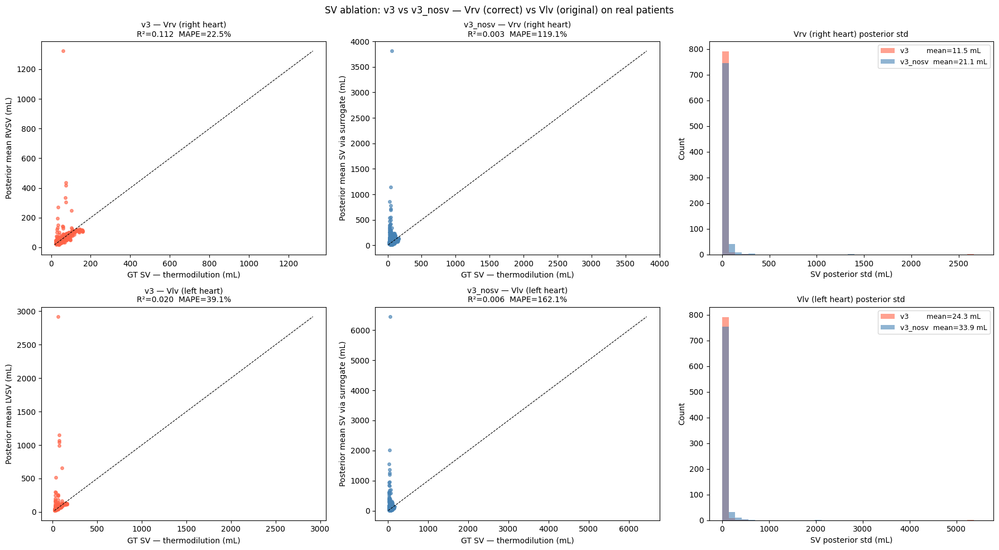

v3 — Vrv (right heart)                    R²=0.112  MAPE=22.5%  post_std=11.5 mL
v3_nosv — Vrv (right heart)               R²=0.003  MAPE=119.1%  post_std=21.1 mL
v3 — Vlv (left heart)                     R²=0.020  MAPE=39.1%  post_std=24.3 mL
v3_nosv — Vlv (left heart)                R²=0.006  MAPE=162.1%  post_std=33.9 mL


In [75]:
# Derive SV via S1 surrogate using either Vrv (right heart) or Vlv (left heart)
def derive_sv(samples_24, hr_arr, wave_idx, wave_std_val):
    """samples_24: (N_pat, N_ABL, 24); returns SV (N_pat, N_ABL) in mL."""
    N_pat = len(samples_24)
    sv_out = np.zeros((N_pat, N_ABL))
    for i in range(N_pat):
        s24 = torch.from_numpy(samples_24[i]).float()
        hr_col = torch.full((N_ABL, 1), float(hr_arr[i]))
        s25 = torch.cat([s24[:, :HR_IDX], hr_col, s24[:, HR_IDX:]], dim=1)
        s25_z = (s25.to(device) - theta_norm_mean) / theta_norm_std
        with torch.no_grad():
            waves_z = surrogate(s25_z)                       # (N_ABL, N_CONT*T)
        w = waves_z.cpu().numpy().reshape(N_ABL, N_CONT, T)[:, wave_idx, :]
        sv_out[i] = (w.max(axis=1) - w.min(axis=1)) * wave_std_val
    return sv_out

print('Deriving RVSV via Vrv (v3)...')
rvsv_v3      = derive_sv(samp_v3,      hr_arr, vrv_idx, vrv_std)
print('Deriving RVSV via Vrv (v3_nosv)...')
rvsv_v3_nosv = derive_sv(samp_v3_nosv, hr_arr, vrv_idx, vrv_std)
print('Deriving LVSV via Vlv (v3)...')
lvsv_v3      = derive_sv(samp_v3,      hr_arr, vlv_idx, vlv_std)
print('Deriving LVSV via Vlv (v3_nosv)...')
lvsv_v3_nosv = derive_sv(samp_v3_nosv, hr_arr, vlv_idx, vlv_std)

sv_gt = np.array([pat['gt']['sv'] for pat in patients])

from scipy.stats import pearsonr

def metrics(sv_mean):
    r2   = pearsonr(sv_gt, sv_mean)[0] ** 2
    mape = np.mean(np.abs(sv_mean - sv_gt) / (np.abs(sv_gt) + 1e-9)) * 100
    return r2, mape

cases = [
    # (row, col, label, sv_arr, color)
    (0, 0, 'v3 — Vrv (right heart)',    rvsv_v3,      'tomato'),
    (0, 1, 'v3_nosv — Vrv (right heart)', rvsv_v3_nosv, 'steelblue'),
    (1, 0, 'v3 — Vlv (left heart)',     lvsv_v3,      'tomato'),
    (1, 1, 'v3_nosv — Vlv (left heart)', lvsv_v3_nosv, 'steelblue'),
]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for row, col, label, sv_arr, color in cases:
    sv_mean = sv_arr.mean(axis=1)
    r2, mape = metrics(sv_mean)
    ax = axes[row, col]
    lo, hi = min(sv_gt.min(), sv_mean.min()), max(sv_gt.max(), sv_mean.max())
    ax.scatter(sv_gt, sv_mean, s=15, alpha=0.65, color=color)
    ax.plot([lo, hi], [lo, hi], 'k--', linewidth=0.8)
    ax.set_xlabel('GT SV — thermodilution (mL)')
    ax.set_ylabel('Posterior mean SV via surrogate (mL)')
    ax.set_title(f'{label}\nR²={r2:.3f}  MAPE={mape:.1f}%', fontsize=10)

# Uncertainty histograms — column 3
for row, (sv_v3, sv_nosv, title) in enumerate([
    (rvsv_v3, rvsv_v3_nosv, 'Vrv (right heart) posterior std'),
    (lvsv_v3, lvsv_v3_nosv, 'Vlv (left heart) posterior std'),
]):
    std_v3    = sv_v3.std(axis=1)
    std_nosv  = sv_nosv.std(axis=1)
    ax = axes[row, 2]
    bins = np.linspace(0, max(std_v3.max(), std_nosv.max()) * 1.05, 40)
    ax.hist(std_v3,   bins=bins, color='tomato',    alpha=0.6,
            label=f'v3        mean={std_v3.mean():.1f} mL')
    ax.hist(std_nosv, bins=bins, color='steelblue', alpha=0.6,
            label=f'v3_nosv  mean={std_nosv.mean():.1f} mL')
    ax.set_xlabel('SV posterior std (mL)'); ax.set_ylabel('Count')
    ax.set_title(title, fontsize=10); ax.legend(fontsize=9)

axes[0, 0].set_ylabel('Posterior mean RVSV (mL)')
axes[1, 0].set_ylabel('Posterior mean LVSV (mL)')
fig.suptitle('SV ablation: v3 vs v3_nosv — Vrv (correct) vs Vlv (original) on real patients',
             fontsize=12)
plt.tight_layout(); plt.show()

for row, col, label, sv_arr, _ in cases:
    sv_mean = sv_arr.mean(axis=1)
    r2, mape = metrics(sv_mean)
    print(f'{label:<40}  R²={r2:.3f}  MAPE={mape:.1f}%  post_std={sv_arr.std(axis=1).mean():.1f} mL')


nosv obs dim: 808
Running inference on 1000 test sims (nosv encoder)...
  1000/1000  (41s)
Done. samples: (1000, 1000, 24)
Deriving RVSV via Vrv...
Deriving LVSV via Vlv...


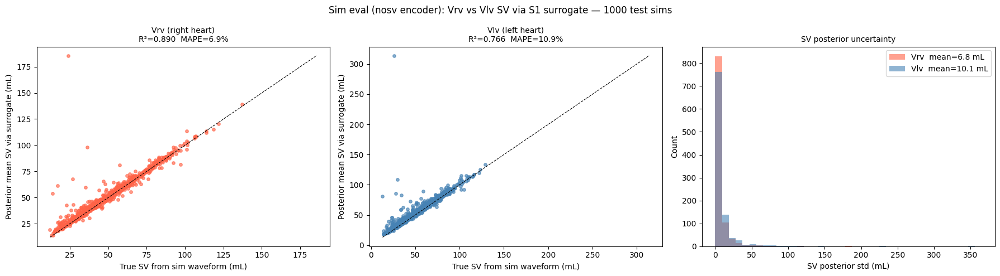

Vrv (right heart)          R²=0.890  MAPE=6.9%  post_std=6.8 mL
Vlv (left heart)           R²=0.766  MAPE=10.9%  post_std=6.8 mL


In [76]:
# Sim eval (nosv encoder): Vrv vs Vlv SV derivation — SV not in observation
# Drops SV scalar from x_test to get 808-dim input, runs enc_nosv + flow_nosv,
# then derives both RVSV (Vrv) and LVSV (Vlv) via S1 surrogate.
# Ground truth SV read directly from test HDF5 waveforms.

def metrics_xy(true, pred):
    r2   = pearsonr(true, pred)[0] ** 2
    mape = np.mean(np.abs(pred - true) / (np.abs(true) + 1e-9)) * 100
    return r2, mape

# Build 808-dim observations: drop SV scalar at position 807
# Layout: [wave(804), map(1), sbp(1), dbp(1), sv(1), hr(1)] -> drop index 807
x_test_nosv = torch.cat([x_test[:, :807], x_test[:, 808:]], dim=1)  # (N_SIM_EVAL, 808)
print(f'nosv obs dim: {x_test_nosv.shape[1]}')

# Run inference with nosv encoder + flow
print(f'Running inference on {N_SIM_EVAL} test sims (nosv encoder)...')
sim_samples_nosv = []
t0 = time.time()
with torch.no_grad():
    for i in range(0, len(x_test_nosv), 64):
        x_b = x_test_nosv[i:i+64].to(device)
        z_b = enc_nosv(x_b)
        for j in range(len(x_b)):
            s = flow_nosv.sample(
                (N_POSTERIOR_SAMPLES,), condition=z_b[j:j+1]
            ).squeeze(1).cpu()
            sim_samples_nosv.append(s)
        if (i // 64) % 5 == 0:
            print(f'  {i+len(x_b)}/{N_SIM_EVAL}  ({time.time()-t0:.0f}s)', end='\r', flush=True)
sim_samples_nosv = torch.stack(sim_samples_nosv)  # (N_SIM_EVAL, N_POSTERIOR_SAMPLES, 24)
print(f'\nDone. samples: {tuple(sim_samples_nosv.shape)}')

# Recover HR from x_test for surrogate reconstruction
_hr_p_mean = stats['parameters']['HR']['mean']
_hr_p_std  = stats['parameters']['HR']['std']
hr_sim = x_test[:, -1].numpy() * _hr_p_std + _hr_p_mean  # (N_SIM_EVAL,)

print('Deriving RVSV via Vrv...')
rvsv_sim = derive_sv(sim_samples_nosv.numpy(), hr_sim, vrv_idx, vrv_std)
print('Deriving LVSV via Vlv...')
lvsv_sim = derive_sv(sim_samples_nosv.numpy(), hr_sim, vlv_idx, vlv_std)

# Load ground-truth SV from test HDF5
test_entries = manifest_test['index'][:N_SIM_EVAL]
data_dir_test = SIM_ROOT / 'test'

vrv_gt_sim, vlv_gt_sim = [], []
for entry in test_entries:
    with h5py.File(data_dir_test / entry['file'], 'r') as _f:
        g = _f[entry['group']]
        vrv_gt_sim.append(float(g['waves/Vrv'][:].max() - g['waves/Vrv'][:].min()))
        vlv_gt_sim.append(float(g['waves/Vlv'][:].max() - g['waves/Vlv'][:].min()))
vrv_gt_sim = np.array(vrv_gt_sim)
vlv_gt_sim = np.array(vlv_gt_sim)

rvsv_sim_mean = rvsv_sim.mean(axis=1)
lvsv_sim_mean = lvsv_sim.mean(axis=1)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, label, sv_pred, sv_true, color in [
    (axes[0], 'Vrv (right heart)', rvsv_sim_mean, vrv_gt_sim, 'tomato'),
    (axes[1], 'Vlv (left heart)',  lvsv_sim_mean, vlv_gt_sim, 'steelblue'),
]:
    r2, mape = metrics_xy(sv_true, sv_pred)
    lo, hi = min(sv_true.min(), sv_pred.min()), max(sv_true.max(), sv_pred.max())
    ax.scatter(sv_true, sv_pred, s=15, alpha=0.65, color=color)
    ax.plot([lo, hi], [lo, hi], 'k--', linewidth=0.8)
    ax.set_xlabel('True SV from sim waveform (mL)')
    ax.set_ylabel('Posterior mean SV via surrogate (mL)')
    ax.set_title(f'{label}\nR²={r2:.3f}  MAPE={mape:.1f}%', fontsize=10)

ax = axes[2]
std_vrv = rvsv_sim.std(axis=1)
std_vlv = lvsv_sim.std(axis=1)
bins = np.linspace(0, max(std_vrv.max(), std_vlv.max()) * 1.05, 40)
ax.hist(std_vrv, bins=bins, color='tomato',    alpha=0.6, label=f'Vrv  mean={std_vrv.mean():.1f} mL')
ax.hist(std_vlv, bins=bins, color='steelblue', alpha=0.6, label=f'Vlv  mean={std_vlv.mean():.1f} mL')
ax.set_xlabel('SV posterior std (mL)'); ax.set_ylabel('Count')
ax.set_title('SV posterior uncertainty', fontsize=10); ax.legend()

fig.suptitle(f'Sim eval (nosv encoder): Vrv vs Vlv SV via S1 surrogate — {N_SIM_EVAL} test sims', fontsize=12)
plt.tight_layout(); plt.show()

for label, sv_pred, sv_true in [
    ('Vrv (right heart)', rvsv_sim_mean, vrv_gt_sim),
    ('Vlv (left heart)',  lvsv_sim_mean, vlv_gt_sim),
]:
    r2, mape = metrics_xy(sv_true, sv_pred)
    print(f'{label:<25}  R²={r2:.3f}  MAPE={mape:.1f}%  post_std={rvsv_sim.std(axis=1).mean():.1f} mL')


Encoding test sims...
z_sims: (1000, 128)
Running 1NN proxy inference...
  done (66s)66s)
Deriving RVSV via Vrv (1NN)...
Deriving LVSV via Vlv (1NN)...


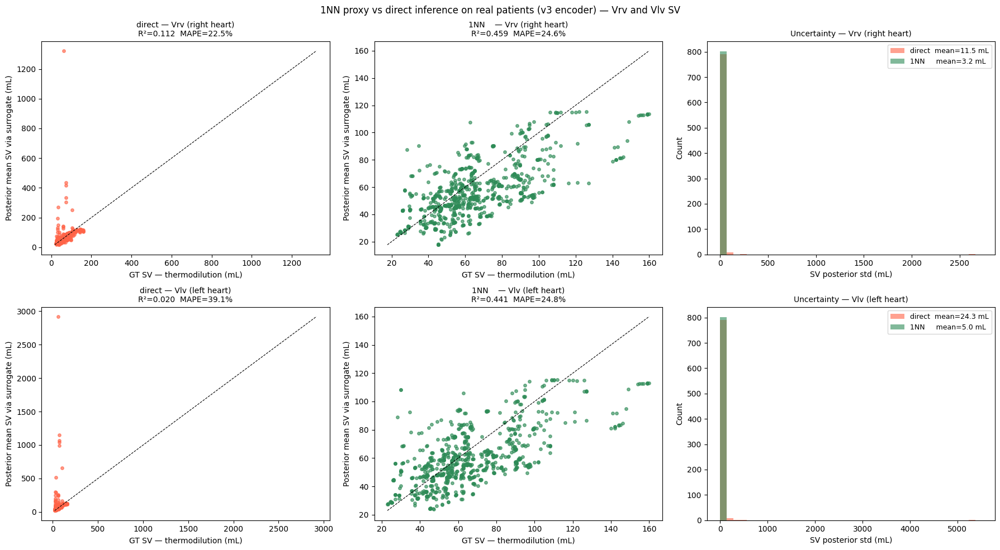

                     R²     MAPE    post_std
direct Vrv        0.112    22.5%      11.5 mL
1NN    Vrv        0.459    24.6%       3.2 mL
direct Vlv        0.020    39.1%      24.3 mL
1NN    Vlv        0.441    24.8%       5.0 mL


In [77]:
# 1NN proxy inference for real patients: find nearest sim in latent space,
# use that sim's z to condition the flow instead of encoder(x_real).
# Diagnostic: if SV improves, posterior samples from direct real inference are
# drifting outside the sim theta prior; if not, the observation is the bottleneck.

# Encode all test sims
print('Encoding test sims...')
with torch.no_grad():
    z_sims_parts = []
    for i in range(0, len(x_test), 256):
        z_sims_parts.append(encoder(x_test[i:i+256].to(device)))
    z_sims = torch.cat(z_sims_parts, dim=0).cpu()  # (N_SIM_EVAL, latent_dim)
print(f'z_sims: {tuple(z_sims.shape)}')

# For each real patient find nearest sim by L2, sample from that z
print('Running 1NN proxy inference...')
samp_1nn = []
t0 = time.time()
for pi, pat in enumerate(patients):
    with torch.no_grad():
        z_real = encoder(pat['x_avg'].unsqueeze(0).to(device)).cpu()  # (1, D)
        i_nn   = ((z_sims - z_real) ** 2).sum(dim=1).argmin().item()
        z_nn   = z_sims[i_nn:i_nn+1].to(device)
        s = flow_net.sample((N_ABL,), condition=z_nn).squeeze(1).cpu()
    samp_1nn.append(s.numpy())
    if pi % 100 == 0:
        print(f'  {pi}/{len(patients)}  ({time.time()-t0:.0f}s)', end='\r', flush=True)
samp_1nn = np.stack(samp_1nn)  # (N_pat, N_ABL, 24)
print(f'  done ({time.time()-t0:.0f}s)')

# Derive RVSV and LVSV via surrogate
print('Deriving RVSV via Vrv (1NN)...')
rvsv_1nn = derive_sv(samp_1nn, hr_arr, vrv_idx, vrv_std)
print('Deriving LVSV via Vlv (1NN)...')
lvsv_1nn = derive_sv(samp_1nn, hr_arr, vlv_idx, vlv_std)

# Plot: direct vs 1NN, for Vrv (row 0) and Vlv (row 1)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for row, (sv_direct, sv_1nn, wave_label) in enumerate([
    (rvsv_v3, rvsv_1nn, 'Vrv (right heart)'),
    (lvsv_v3, lvsv_1nn, 'Vlv (left heart)'),
]):
    for col, (sv_arr, label, color) in enumerate([
        (sv_direct, f'direct — {wave_label}', 'tomato'),
        (sv_1nn,    f'1NN    — {wave_label}', 'seagreen'),
    ]):
        sv_mean = sv_arr.mean(axis=1)
        r2, mape = metrics_xy(sv_gt, sv_mean)
        ax = axes[row, col]
        lo = min(sv_gt.min(), sv_mean.min()); hi = max(sv_gt.max(), sv_mean.max())
        ax.scatter(sv_gt, sv_mean, s=15, alpha=0.65, color=color)
        ax.plot([lo, hi], [lo, hi], 'k--', linewidth=0.8)
        ax.set_xlabel('GT SV — thermodilution (mL)')
        ax.set_ylabel('Posterior mean SV via surrogate (mL)')
        ax.set_title(f'{label}\nR²={r2:.3f}  MAPE={mape:.1f}%', fontsize=10)

    ax = axes[row, 2]
    std_d = sv_direct.std(axis=1); std_n = sv_1nn.std(axis=1)
    bins  = np.linspace(0, max(std_d.max(), std_n.max()) * 1.05, 40)
    ax.hist(std_d, bins=bins, color='tomato',   alpha=0.6, label=f'direct  mean={std_d.mean():.1f} mL')
    ax.hist(std_n, bins=bins, color='seagreen', alpha=0.6, label=f'1NN     mean={std_n.mean():.1f} mL')
    ax.set_xlabel('SV posterior std (mL)'); ax.set_ylabel('Count')
    ax.set_title(f'Uncertainty — {wave_label}', fontsize=10); ax.legend(fontsize=9)

fig.suptitle('1NN proxy vs direct inference on real patients (v3 encoder) — Vrv and Vlv SV',
             fontsize=12)
plt.tight_layout(); plt.show()

print(f'{"":15}  {"R²":>6}  {"MAPE":>7}  {"post_std":>10}')
for label, sv_arr in [
    ('direct Vrv', rvsv_v3),
    ('1NN    Vrv', rvsv_1nn),
    ('direct Vlv', lvsv_v3),
    ('1NN    Vlv', lvsv_1nn),
]:
    sv_mean = sv_arr.mean(axis=1)
    r2, mape = metrics_xy(sv_gt, sv_mean)
    print(f'{label:<15}  {r2:>6.3f}  {mape:>6.1f}%  {sv_arr.std(axis=1).mean():>8.1f} mL')


Encoding test sims (nosv)...
z_sims_nosv: (1000, 128)
Running 1NN proxy inference (nosv)...
  done (66s)66s)
Deriving RVSV via Vrv (1NN nosv)...
Deriving LVSV via Vlv (1NN nosv)...


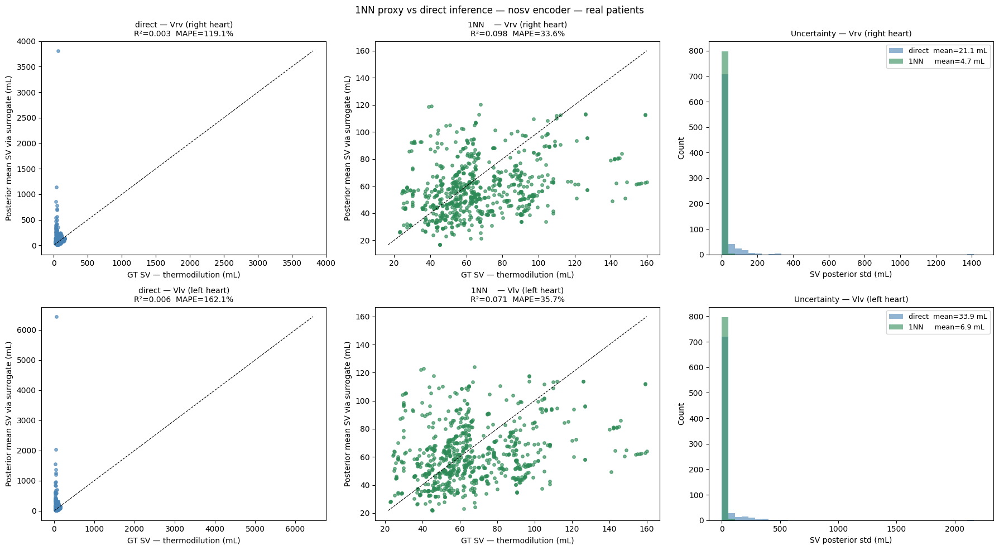

                     R²     MAPE    post_std
direct Vrv        0.003   119.1%      21.1 mL
1NN    Vrv        0.098    33.6%       4.7 mL
direct Vlv        0.006   162.1%      33.9 mL
1NN    Vlv        0.071    35.7%       6.9 mL


In [78]:
# 1NN proxy inference — nosv encoder (808-dim obs, no SV scalar)
# Same diagnostic as above but for enc_nosv + flow_nosv.

print('Encoding test sims (nosv)...')
with torch.no_grad():
    z_sims_nosv_parts = []
    for i in range(0, len(x_test_nosv), 256):
        z_sims_nosv_parts.append(enc_nosv(x_test_nosv[i:i+256].to(device)))
    z_sims_nosv = torch.cat(z_sims_nosv_parts, dim=0).cpu()
print(f'z_sims_nosv: {tuple(z_sims_nosv.shape)}')

print('Running 1NN proxy inference (nosv)...')
samp_1nn_nosv = []
t0 = time.time()
for pi, pat in enumerate(patients):
    with torch.no_grad():
        z_real = enc_nosv(pat['x_avg_nosv'].unsqueeze(0).to(device)).cpu()
        i_nn   = ((z_sims_nosv - z_real) ** 2).sum(dim=1).argmin().item()
        z_nn   = z_sims_nosv[i_nn:i_nn+1].to(device)
        s = flow_nosv.sample((N_ABL,), condition=z_nn).squeeze(1).cpu()
    samp_1nn_nosv.append(s.numpy())
    if pi % 100 == 0:
        print(f'  {pi}/{len(patients)}  ({time.time()-t0:.0f}s)', end='\r', flush=True)
samp_1nn_nosv = np.stack(samp_1nn_nosv)
print(f'  done ({time.time()-t0:.0f}s)')

print('Deriving RVSV via Vrv (1NN nosv)...')
rvsv_1nn_nosv = derive_sv(samp_1nn_nosv, hr_arr, vrv_idx, vrv_std)
print('Deriving LVSV via Vlv (1NN nosv)...')
lvsv_1nn_nosv = derive_sv(samp_1nn_nosv, hr_arr, vlv_idx, vlv_std)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for row, (sv_direct, sv_1nn, wave_label) in enumerate([
    (rvsv_v3_nosv, rvsv_1nn_nosv, 'Vrv (right heart)'),
    (lvsv_v3_nosv, lvsv_1nn_nosv, 'Vlv (left heart)'),
]):
    for col, (sv_arr, label, color) in enumerate([
        (sv_direct, f'direct — {wave_label}', 'steelblue'),
        (sv_1nn,    f'1NN    — {wave_label}', 'seagreen'),
    ]):
        sv_mean = sv_arr.mean(axis=1)
        r2, mape = metrics_xy(sv_gt, sv_mean)
        ax = axes[row, col]
        lo = min(sv_gt.min(), sv_mean.min()); hi = max(sv_gt.max(), sv_mean.max())
        ax.scatter(sv_gt, sv_mean, s=15, alpha=0.65, color=color)
        ax.plot([lo, hi], [lo, hi], 'k--', linewidth=0.8)
        ax.set_xlabel('GT SV — thermodilution (mL)')
        ax.set_ylabel('Posterior mean SV via surrogate (mL)')
        ax.set_title(f'{label}\nR²={r2:.3f}  MAPE={mape:.1f}%', fontsize=10)

    ax = axes[row, 2]
    std_d = sv_direct.std(axis=1); std_n = sv_1nn.std(axis=1)
    bins  = np.linspace(0, max(std_d.max(), std_n.max()) * 1.05, 40)
    ax.hist(std_d, bins=bins, color='steelblue', alpha=0.6, label=f'direct  mean={std_d.mean():.1f} mL')
    ax.hist(std_n, bins=bins, color='seagreen',  alpha=0.6, label=f'1NN     mean={std_n.mean():.1f} mL')
    ax.set_xlabel('SV posterior std (mL)'); ax.set_ylabel('Count')
    ax.set_title(f'Uncertainty — {wave_label}', fontsize=10); ax.legend(fontsize=9)

fig.suptitle('1NN proxy vs direct inference — nosv encoder — real patients', fontsize=12)
plt.tight_layout(); plt.show()

print(f'{"":15}  {"R²":>6}  {"MAPE":>7}  {"post_std":>10}')
for label, sv_arr in [
    ('direct Vrv', rvsv_v3_nosv),
    ('1NN    Vrv', rvsv_1nn_nosv),
    ('direct Vlv', lvsv_v3_nosv),
    ('1NN    Vlv', lvsv_1nn_nosv),
]:
    sv_mean = sv_arr.mean(axis=1)
    r2, mape = metrics_xy(sv_gt, sv_mean)
    print(f'{label:<15}  {r2:>6.3f}  {mape:>6.1f}%  {sv_arr.std(axis=1).mean():>8.1f} mL')


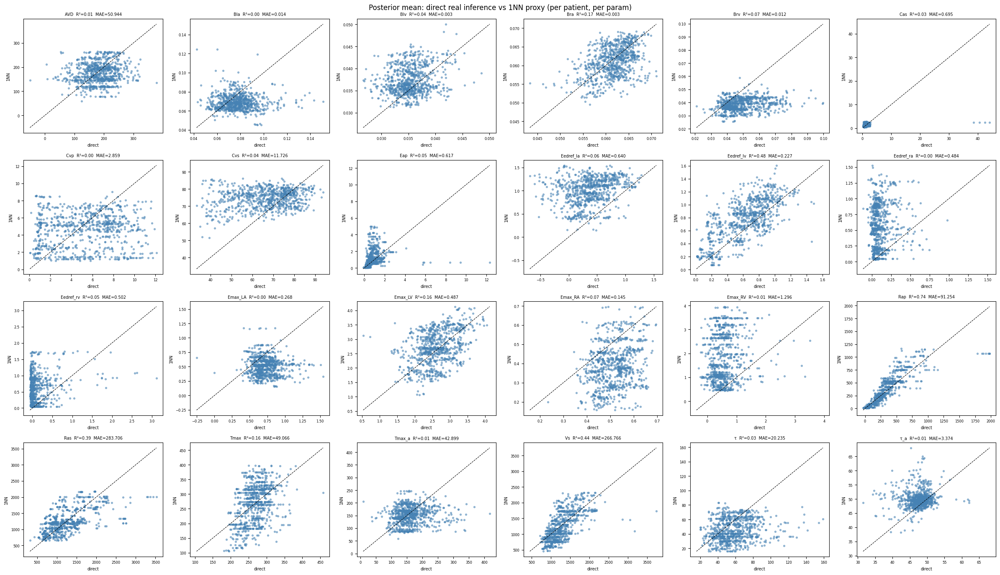

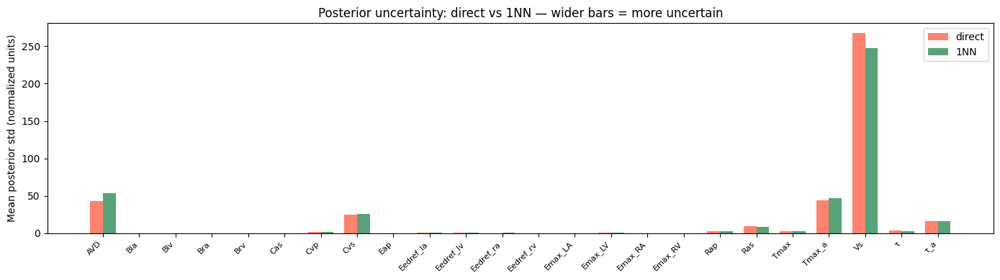

Mean |direct_mean - 1nn_mean| per param:
  overall: 34.5093  max: 283.7061 (Ras)

Param             MAD   std_direct    std_1nn
---------------------------------------------
AVD           50.9444      42.8797    53.4047
Bla            0.0140       0.0274     0.0254
Blv            0.0035       0.0103     0.0105
Bra            0.0034       0.0189     0.0198
Brv            0.0117       0.0143     0.0102
Cas            0.6947       0.0190     0.0156
Cvp            2.8587       1.5228     1.3450
Cvs           11.7262      24.6947    25.2834
Eap            0.6170       0.0210     0.0211
Eedref_la      0.6404       0.5842     0.6554
Eedref_lv      0.2271       0.4059     0.4894
Eedref_ra      0.4838       0.0784     0.3114
Eedref_rv      0.5023       0.0544     0.2384
Emax_LA        0.2679       0.2448     0.2242
Emax_LV        0.4865       0.9657     0.9824
Emax_RA        0.1450       0.1789     0.1676
Emax_RV        1.2964       0.0689     0.0983
Rap           91.2539       2.4128     2.694

In [79]:
# Compare posterior theta distributions: direct real inference vs 1NN proxy
# If means/stds look similar -> decoder amplifying small shift (brittleness)
# If qualitatively different -> flow producing OOD posteriors on real latents

means_direct = samp_v3.mean(axis=1)    # (N_pat, 24)
means_1nn    = samp_1nn.mean(axis=1)   # (N_pat, 24)
stds_direct  = samp_v3.std(axis=1)     # (N_pat, 24)
stds_1nn     = samp_1nn.std(axis=1)    # (N_pat, 24)

# Scatter: direct posterior mean vs 1NN posterior mean, one panel per param
ncols, nrows = 6, 4
fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 3.5 * nrows))

for i, name in enumerate(PARAM_KEYS_INFER):
    ax = axes[i // ncols, i % ncols]
    d, n = means_direct[:, i], means_1nn[:, i]
    lo, hi = min(d.min(), n.min()), max(d.max(), n.max())
    ax.scatter(d, n, s=8, alpha=0.5, color='steelblue', rasterized=True)
    ax.plot([lo, hi], [lo, hi], 'k--', linewidth=0.8)
    r2 = pearsonr(d, n)[0] ** 2
    mae = np.mean(np.abs(d - n))
    ax.set_title(f'{name}  R²={r2:.2f}  MAE={mae:.3f}', fontsize=7)
    ax.set_xlabel('direct', fontsize=7); ax.set_ylabel('1NN', fontsize=7)
    ax.tick_params(labelsize=6)

for i in range(len(PARAM_KEYS_INFER), nrows * ncols):
    axes[i // ncols, i % ncols].axis('off')

fig.suptitle('Posterior mean: direct real inference vs 1NN proxy (per patient, per param)', fontsize=12)
plt.tight_layout(); plt.show()

# Posterior std comparison: direct vs 1NN, aggregated across patients
mean_std_direct = stds_direct.mean(axis=0)   # (24,)
mean_std_1nn    = stds_1nn.mean(axis=0)       # (24,)

fig, ax = plt.subplots(figsize=(14, 4))
x = np.arange(len(PARAM_KEYS_INFER))
w = 0.35
ax.bar(x - w/2, mean_std_direct, width=w, color='tomato',   alpha=0.8, label='direct')
ax.bar(x + w/2, mean_std_1nn,    width=w, color='seagreen', alpha=0.8, label='1NN')
ax.set_xticks(x); ax.set_xticklabels(PARAM_KEYS_INFER, rotation=45, ha='right', fontsize=8)
ax.set_ylabel('Mean posterior std (normalized units)')
ax.set_title('Posterior uncertainty: direct vs 1NN — wider bars = more uncertain'); ax.legend()
plt.tight_layout(); plt.show()

# Summary: mean absolute difference in posterior means across all params and patients
mad_per_param = np.abs(means_direct - means_1nn).mean(axis=0)  # (24,)
print(f'Mean |direct_mean - 1nn_mean| per param:')
print(f'  overall: {mad_per_param.mean():.4f}  max: {mad_per_param.max():.4f} ({PARAM_KEYS_INFER[mad_per_param.argmax()]})')
print()
print(f'{"Param":<12} {"MAD":>8} {"std_direct":>12} {"std_1nn":>10}')
print('-' * 45)
for i, name in enumerate(PARAM_KEYS_INFER):
    print(f'{name:<12} {mad_per_param[i]:>8.4f} {mean_std_direct[i]:>12.4f} {mean_std_1nn[i]:>10.4f}')
